# Benchmarking Field Transformations


### DONE - FT-HMC implemented for 8x8 2D QED (using SiLU as activation function).

- [x] Try to minimize size of the force in training. No significant improvements.
- [x]  Some test on ergodicity
- [x] (calculate the probablity of generating the configs obtained via conventional HMC).

### TODO

- [ ] Plot the force size distribution 
- [ ] Is the large force from the original action or Field-Transforma
tion the determinant?
- [ ] If from the determinant, then the fermion force won't cause problem for HMC
- [ ] Use the same Field-Transformation for larger system (say 16x16, 32x32, 64x64, etc)
- [ ] Study how the delta H depends on the system size ( perhaps delta H ~ sqrt(volume) )
- [ ] Study the auto-correlation for observables, topo, plaq, flowed plaq, etc.
- [ ] Improving the Field-Transformation to reduce force.

## Setup, `import`'s, ..., etc

In [1]:
import os
import sys
import torch

from functools import reduce
from IPython.core.interactiveshell import InteractiveShell

%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format ='retina'

InteractiveShell.ast_node_interactivity = "all"


project_dir = os.path.abspath('../../../')
if project_dir not in sys.path:
    sys.path.append(project_dir)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
import fthmc.utils.io as io
logger = io.Logger()

torch.manual_seed(9)
# torch.set_default_tensor_type(torch.FloatTensor)

#torch.set_num_threads(param.nth)
#torch.set_num_interop_threads(param.nth_interop)
#os.environ["OMP_NUM_THREADS"] = str(param.nth)
#os.environ["KMP_BLOCKTIME"] = "0"
#os.environ["KMP_SETTINGS"] = "1"
#os.environ["KMP_AFFINITY"]= "granularity=fine,verbose,compact,1,0"

torch.set_default_tensor_type(torch.FloatTensor)
logger = io.Logger()

## Setup experiment

- Specify `Param` object for lattice and HMC info

- Specify `TrainConfig` object for training our model

- Note, we train the `pre_flow_model` using the Kullback-Leibler divergence:

$$
D_{\mathrm{KL}} = \left(P\|Q\right) = \sum_{x\in\mathcal{X}} P(x)\log\left(\frac{P(x)}{Q(x)}\right)
$$

In [3]:
%matplotlib inline

In [4]:
import matplotlib as mpl

from fthmc.train import train
from fthmc.utils.param import Param
from fthmc.config import TrainConfig, PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_u1_equiv_layers, set_weights
from fthmc.utils.plot_helpers import save_live_plots

import fthmc.utils.qed_helpers as qed

import datetime

from fthmc.config import LOGS_DIR

mpl.rcParams['text.usetex'] = False
plt.style.use('/Users/saforem2/.matplotlib/stylelib/molokai.mplstyle')

param = {
    'L': 4,
    'tau': 0.5,
    'nrun': 2,
    'beta': 4.,
    'nstep': 5,
    'ntraj': 1000,
    'nprint': 100,
    'seed': 1331,
}

train_config = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 50,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 64,
    'print_freq': 20,
    'plot_freq': 20,
})

param = Param(**param)
logger.log(repr(param))
logger.log(repr(train_config))

#logdir = io.make_experiment_dirs(param, train_config)

TORCH DEVICE: cpu


[22:55:51]  Param:                                                                           
            ----------------                                                                 
            beta=4.0                                                                         
            L=4                                                                              
            tau=0.5                                                                          
            nstep=5                                                                          
            ntraj=1000                                                                       
            nrun=2                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[4, 4]                                                                       
            nd=2                                                                             
            shape=[2, 4, 4]                                                                  
            volume=16                                                                        
            dt=0.1

            TrainConfig:                                                                     
            ----------------                                                                 
            n_era=10                                                                         
            n_epoch=50                                                                       
            n_layers=24                                                                      
            n_s_nets=2                                                                       
            hidden_sizes=[8, 8]                                                              
            kernel_size=3                                                                    
            base_lr=0.001                                                                    
            batch_size=64                                                                    
            print_freq=20                                                                    
            plot_freq=20                                                                     
            with_force=False

## Specify directories for saving model, etc

[22:55:54]  Creating directory:                                                              
            /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2021-06-12-225554

[22:55:54]  Creating directory: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5
            /2021-06-12-225554/plots

[22:55:54]  Param:                                                                           
            ----------------                                                                 
            beta=4.0                                                                         
            L=4                                                                              
            tau=0.5                                                                          
            nstep=5                                                                          
            ntraj=1000                                                                       
            nrun=2                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[4, 4]                                                                       
            nd=2                                                                             
            shape=[2, 4, 4]                                                                  
            volume=16                                                                        
            dt=0.1

            action=1.000 plaq=0.000 charge=0.000

            dt=0.002 traj=2 accept=True dH=-0.141 expdH=1.151 dqsq=0.000 q=0 logp=59.533     
            plaq=0.930

            dt=0.002 traj=12 accept=True dH=-0.152 expdH=1.164 dqsq=0.000 q=0 logp=61.081    
            plaq=0.954

            dt=0.002 traj=22 accept=True dH=-0.123 expdH=1.131 dqsq=0.000 q=0 logp=59.096    
            plaq=0.923

            dt=0.002 traj=32 accept=True dH=-0.081 expdH=1.084 dqsq=0.000 q=0 logp=57.696    
            plaq=0.901

            dt=0.002 traj=42 accept=True dH=-0.047 expdH=1.048 dqsq=0.000 q=0 logp=60.711    
            plaq=0.949

            dt=0.002 traj=52 accept=True dH=-0.145 expdH=1.155 dqsq=0.000 q=0 logp=55.966    
            plaq=0.874

            dt=0.002 traj=62 accept=True dH=-0.129 expdH=1.138 dqsq=0.000 q=0 logp=58.092    
            plaq=0.908

            dt=0.002 traj=72 accept=True dH=0.145 expdH=0.865 dqsq=0.000 q=0 logp=54.238     
            plaq=0.847

            dt=0.002 traj=82 accept=True dH=0.003 expdH=0.997 dqsq=0.000 q=0 logp=57.596     
            plaq=0.900

            dt=0.002 traj=92 accept=True dH=-0.056 expdH=1.058 dqsq=0.000 q=0 logp=48.052    
            plaq=0.751

            dt=0.002 traj=102 accept=True dH=-0.078 expdH=1.081 dqsq=0.000 q=0 logp=54.791   
            plaq=0.856

            dt=0.002 traj=112 accept=True dH=-0.096 expdH=1.101 dqsq=0.000 q=0 logp=57.077   
            plaq=0.892

            dt=0.002 traj=122 accept=True dH=-0.065 expdH=1.068 dqsq=0.000 q=0 logp=59.703   
            plaq=0.933

            dt=0.002 traj=132 accept=True dH=0.170 expdH=0.844 dqsq=0.000 q=0 logp=55.524    
            plaq=0.868

            dt=0.002 traj=142 accept=True dH=-0.043 expdH=1.043 dqsq=0.000 q=0 logp=53.460   
            plaq=0.835

            dt=0.002 traj=152 accept=True dH=-0.044 expdH=1.045 dqsq=0.000 q=0 logp=55.480   
            plaq=0.867

            dt=0.002 traj=162 accept=True dH=0.161 expdH=0.851 dqsq=0.000 q=0 logp=45.256    
            plaq=0.707

            dt=0.002 traj=172 accept=True dH=0.070 expdH=0.932 dqsq=0.000 q=0 logp=53.452    
            plaq=0.835

            dt=0.002 traj=182 accept=True dH=0.091 expdH=0.913 dqsq=0.000 q=0 logp=53.278    
            plaq=0.832

            dt=0.002 traj=192 accept=True dH=0.038 expdH=0.963 dqsq=0.000 q=0 logp=57.865    
            plaq=0.904

            dt=0.002 traj=202 accept=True dH=0.069 expdH=0.933 dqsq=0.000 q=0 logp=58.326    
            plaq=0.911

            dt=0.002 traj=212 accept=True dH=0.052 expdH=0.950 dqsq=0.000 q=0 logp=42.570    
            plaq=0.665

            dt=0.002 traj=222 accept=True dH=0.196 expdH=0.822 dqsq=0.000 q=0 logp=53.734    
            plaq=0.840

[22:55:55]  dt=0.002 traj=232 accept=True dH=0.056 expdH=0.945 dqsq=0.000 q=0 logp=55.707    
            plaq=0.870

            dt=0.002 traj=242 accept=True dH=0.221 expdH=0.802 dqsq=0.000 q=0 logp=50.970    
            plaq=0.796

            dt=0.002 traj=252 accept=True dH=0.180 expdH=0.836 dqsq=0.000 q=0 logp=50.601    
            plaq=0.791

            dt=0.002 traj=262 accept=True dH=-0.003 expdH=1.003 dqsq=0.000 q=0 logp=57.246   
            plaq=0.894

            dt=0.002 traj=272 accept=True dH=0.101 expdH=0.904 dqsq=0.000 q=0 logp=55.658    
            plaq=0.870

            dt=0.002 traj=282 accept=True dH=0.048 expdH=0.953 dqsq=0.000 q=0 logp=56.173    
            plaq=0.878

            dt=0.002 traj=292 accept=True dH=-0.064 expdH=1.066 dqsq=0.000 q=0 logp=60.384   
            plaq=0.943

            dt=0.002 traj=302 accept=True dH=0.114 expdH=0.892 dqsq=0.000 q=0 logp=57.057    
            plaq=0.892

            dt=0.002 traj=312 accept=True dH=-0.166 expdH=1.181 dqsq=0.000 q=0 logp=56.165   
            plaq=0.878

            dt=0.002 traj=322 accept=True dH=-0.166 expdH=1.181 dqsq=0.000 q=0 logp=58.187   
            plaq=0.909

            dt=0.002 traj=332 accept=True dH=0.172 expdH=0.842 dqsq=0.000 q=0 logp=53.223    
            plaq=0.832

            dt=0.002 traj=342 accept=True dH=-0.040 expdH=1.040 dqsq=0.000 q=0 logp=58.279   
            plaq=0.911

            dt=0.002 traj=352 accept=True dH=-0.058 expdH=1.060 dqsq=0.000 q=0 logp=56.656   
            plaq=0.885

            dt=0.002 traj=362 accept=True dH=0.030 expdH=0.970 dqsq=0.000 q=0 logp=54.447    
            plaq=0.851

            dt=0.002 traj=372 accept=True dH=0.142 expdH=0.867 dqsq=0.000 q=0 logp=55.586    
            plaq=0.869

            dt=0.002 traj=382 accept=True dH=-0.188 expdH=1.207 dqsq=0.000 q=0 logp=58.006   
            plaq=0.906

            dt=0.002 traj=392 accept=True dH=0.109 expdH=0.897 dqsq=0.000 q=0 logp=52.288    
            plaq=0.817

            dt=0.002 traj=402 accept=True dH=-0.022 expdH=1.022 dqsq=0.000 q=0 logp=56.147   
            plaq=0.877

            dt=0.002 traj=412 accept=True dH=0.164 expdH=0.849 dqsq=0.000 q=0 logp=54.008    
            plaq=0.844

            dt=0.002 traj=422 accept=True dH=0.060 expdH=0.942 dqsq=0.000 q=0 logp=53.815    
            plaq=0.841

            dt=0.002 traj=432 accept=True dH=-0.088 expdH=1.092 dqsq=0.000 q=0 logp=55.867   
            plaq=0.873

            dt=0.002 traj=442 accept=True dH=-0.109 expdH=1.115 dqsq=0.000 q=0 logp=56.613   
            plaq=0.885

            dt=0.002 traj=452 accept=True dH=0.108 expdH=0.898 dqsq=0.000 q=0 logp=57.394    
            plaq=0.897

            dt=0.002 traj=462 accept=True dH=0.024 expdH=0.977 dqsq=0.000 q=0 logp=57.351    
            plaq=0.896

            dt=0.002 traj=472 accept=True dH=-0.006 expdH=1.006 dqsq=0.000 q=0 logp=56.766   
            plaq=0.887

            dt=0.002 traj=482 accept=True dH=-0.041 expdH=1.042 dqsq=0.000 q=0 logp=61.189   
            plaq=0.956

            dt=0.002 traj=492 accept=True dH=0.145 expdH=0.865 dqsq=0.000 q=0 logp=53.750    
            plaq=0.840

            dt=0.002 traj=502 accept=True dH=-0.088 expdH=1.092 dqsq=0.000 q=0 logp=55.552   
            plaq=0.868

            dt=0.002 traj=512 accept=True dH=0.074 expdH=0.928 dqsq=0.000 q=0 logp=57.525    
            plaq=0.899

            dt=0.002 traj=522 accept=False dH=0.095 expdH=0.910 dqsq=0.000 q=0 logp=55.130   
            plaq=0.861

            dt=0.002 traj=532 accept=True dH=0.232 expdH=0.793 dqsq=0.000 q=0 logp=54.828    
            plaq=0.857

            dt=0.002 traj=542 accept=True dH=0.136 expdH=0.873 dqsq=0.000 q=0 logp=52.112    
            plaq=0.814

            dt=0.002 traj=552 accept=False dH=0.042 expdH=0.959 dqsq=0.000 q=0 logp=47.474   
            plaq=0.742

[22:55:56]  dt=0.002 traj=562 accept=True dH=-0.203 expdH=1.225 dqsq=0.000 q=0 logp=55.769   
            plaq=0.871

            dt=0.002 traj=572 accept=True dH=0.087 expdH=0.916 dqsq=0.000 q=0 logp=56.082    
            plaq=0.876

            dt=0.002 traj=582 accept=True dH=0.007 expdH=0.993 dqsq=0.000 q=0 logp=52.980    
            plaq=0.828

            dt=0.002 traj=592 accept=True dH=0.114 expdH=0.892 dqsq=0.000 q=0 logp=57.142    
            plaq=0.893

            dt=0.002 traj=602 accept=True dH=-0.009 expdH=1.009 dqsq=0.000 q=0 logp=57.402   
            plaq=0.897

            dt=0.002 traj=612 accept=True dH=0.142 expdH=0.867 dqsq=0.000 q=0 logp=54.287    
            plaq=0.848

            dt=0.002 traj=622 accept=True dH=-0.001 expdH=1.001 dqsq=0.000 q=0 logp=59.488   
            plaq=0.930

            dt=0.002 traj=632 accept=True dH=0.065 expdH=0.937 dqsq=0.000 q=0 logp=50.486    
            plaq=0.789

            dt=0.002 traj=642 accept=True dH=0.237 expdH=0.789 dqsq=0.000 q=0 logp=55.186    
            plaq=0.862

            dt=0.002 traj=652 accept=True dH=0.155 expdH=0.857 dqsq=0.000 q=0 logp=54.346    
            plaq=0.849

            dt=0.002 traj=662 accept=True dH=-0.102 expdH=1.107 dqsq=0.000 q=0 logp=58.133   
            plaq=0.908

            dt=0.002 traj=672 accept=True dH=-0.071 expdH=1.074 dqsq=0.000 q=0 logp=54.206   
            plaq=0.847

            dt=0.002 traj=682 accept=True dH=-0.009 expdH=1.009 dqsq=0.000 q=0 logp=55.284   
            plaq=0.864

            dt=0.002 traj=692 accept=True dH=0.123 expdH=0.884 dqsq=0.000 q=0 logp=51.313    
            plaq=0.802

            dt=0.002 traj=702 accept=True dH=-0.024 expdH=1.024 dqsq=0.000 q=0 logp=54.691   
            plaq=0.855

            dt=0.002 traj=712 accept=False dH=0.101 expdH=0.904 dqsq=0.000 q=0 logp=57.177   
            plaq=0.893

            dt=0.002 traj=722 accept=True dH=-0.004 expdH=1.004 dqsq=0.000 q=0 logp=56.350   
            plaq=0.880

            dt=0.002 traj=732 accept=True dH=-0.080 expdH=1.083 dqsq=0.000 q=0 logp=58.656   
            plaq=0.917

            dt=0.002 traj=742 accept=True dH=0.063 expdH=0.939 dqsq=0.000 q=0 logp=43.061    
            plaq=0.673

            dt=0.002 traj=752 accept=True dH=0.120 expdH=0.887 dqsq=0.000 q=0 logp=54.064    
            plaq=0.845

            dt=0.002 traj=762 accept=True dH=-0.024 expdH=1.024 dqsq=0.000 q=0 logp=58.986   
            plaq=0.922

            dt=0.002 traj=772 accept=True dH=0.035 expdH=0.966 dqsq=0.000 q=0 logp=54.448    
            plaq=0.851

            dt=0.002 traj=782 accept=True dH=0.093 expdH=0.911 dqsq=0.000 q=0 logp=57.471    
            plaq=0.898

            dt=0.002 traj=792 accept=True dH=0.051 expdH=0.951 dqsq=0.000 q=0 logp=58.169    
            plaq=0.909

            dt=0.002 traj=802 accept=True dH=0.051 expdH=0.951 dqsq=0.000 q=0 logp=57.491    
            plaq=0.898

            dt=0.002 traj=812 accept=True dH=-0.006 expdH=1.006 dqsq=0.000 q=0 logp=57.939   
            plaq=0.905

            dt=0.002 traj=822 accept=True dH=-0.102 expdH=1.107 dqsq=0.000 q=0 logp=55.879   
            plaq=0.873

            dt=0.002 traj=832 accept=True dH=0.074 expdH=0.928 dqsq=0.000 q=0 logp=50.970    
            plaq=0.796

            dt=0.002 traj=842 accept=True dH=0.062 expdH=0.940 dqsq=0.000 q=0 logp=55.782    
            plaq=0.872

            dt=0.002 traj=852 accept=True dH=0.034 expdH=0.966 dqsq=0.000 q=0 logp=55.500    
            plaq=0.867

            dt=0.002 traj=862 accept=True dH=0.018 expdH=0.982 dqsq=0.000 q=0 logp=60.588    
            plaq=0.947

            dt=0.002 traj=872 accept=True dH=0.157 expdH=0.855 dqsq=0.000 q=0 logp=52.705    
            plaq=0.824

[22:55:57]  dt=0.002 traj=882 accept=True dH=-0.061 expdH=1.063 dqsq=0.000 q=0 logp=57.602   
            plaq=0.900

            dt=0.002 traj=892 accept=True dH=0.021 expdH=0.979 dqsq=0.000 q=0 logp=53.294    
            plaq=0.833

            dt=0.002 traj=902 accept=True dH=0.180 expdH=0.835 dqsq=0.000 q=0 logp=56.088    
            plaq=0.876

            dt=0.002 traj=912 accept=True dH=-0.225 expdH=1.252 dqsq=0.000 q=0 logp=54.190   
            plaq=0.847

            dt=0.002 traj=922 accept=True dH=0.143 expdH=0.867 dqsq=0.000 q=0 logp=51.483    
            plaq=0.804

            dt=0.002 traj=932 accept=False dH=0.115 expdH=0.891 dqsq=0.000 q=0 logp=52.435   
            plaq=0.819

            dt=0.002 traj=942 accept=True dH=0.162 expdH=0.851 dqsq=0.000 q=0 logp=50.784    
            plaq=0.794

            dt=0.002 traj=952 accept=True dH=0.125 expdH=0.883 dqsq=0.000 q=0 logp=54.583    
            plaq=0.853

            dt=0.002 traj=962 accept=True dH=-0.126 expdH=1.134 dqsq=0.000 q=0 logp=55.759   
            plaq=0.871

            dt=0.002 traj=972 accept=True dH=-0.021 expdH=1.021 dqsq=0.000 q=0 logp=56.986   
            plaq=0.890

            dt=0.002 traj=982 accept=True dH=-0.076 expdH=1.079 dqsq=0.000 q=0 logp=57.597   
            plaq=0.900

            dt=0.002 traj=992 accept=True dH=-0.048 expdH=1.049 dqsq=0.000 q=0 logp=53.209   
            plaq=0.831

[22:55:57]  Creating directory: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5
            /2021-06-12-225554/plots/run0

[22:55:57]  Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run0/dt.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run0/traj.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run0/accept.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run0/dH.pdf

[22:55:58]  Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run0/expdH.pdf

/Users/saforem2/nftqcd/fthmc/fthmc/utils/plot_helpers.py:108: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  metric = np.array(metric)
/Users/saforem2/nftqcd/fthmc/fthmc/utils/plot_helpers.py:108: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  metric = np.array(metric)


            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run0/dqsq.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run0/q.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run0/logp.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run0/plaq.pdf

[22:55:58]  dt=0.002 traj=1002 accept=True dH=0.139 expdH=0.870 dqsq=0.000 q=0 logp=51.390   
            plaq=0.803

            dt=0.002 traj=1012 accept=True dH=0.081 expdH=0.922 dqsq=0.000 q=0 logp=50.668   
            plaq=0.792

            dt=0.002 traj=1022 accept=True dH=0.108 expdH=0.897 dqsq=0.000 q=0 logp=46.552   
            plaq=0.727

            dt=0.002 traj=1032 accept=True dH=0.068 expdH=0.934 dqsq=0.000 q=0 logp=57.548   
            plaq=0.899

            dt=0.002 traj=1042 accept=True dH=0.105 expdH=0.901 dqsq=0.000 q=0 logp=54.512   
            plaq=0.852

            dt=0.002 traj=1052 accept=True dH=0.091 expdH=0.913 dqsq=0.000 q=0 logp=53.154   
            plaq=0.831

            dt=0.002 traj=1062 accept=True dH=-0.022 expdH=1.022 dqsq=0.000 q=0 logp=53.598  
            plaq=0.837

            dt=0.002 traj=1072 accept=True dH=0.001 expdH=0.999 dqsq=0.000 q=0 logp=55.705   
            plaq=0.870

            dt=0.002 traj=1082 accept=True dH=0.004 expdH=0.996 dqsq=0.000 q=0 logp=57.671   
            plaq=0.901

            dt=0.002 traj=1092 accept=True dH=0.009 expdH=0.991 dqsq=0.000 q=0 logp=52.181   
            plaq=0.815

[22:55:59]  dt=0.002 traj=1102 accept=True dH=0.032 expdH=0.969 dqsq=0.000 q=0 logp=56.853   
            plaq=0.888

            dt=0.002 traj=1112 accept=True dH=-0.122 expdH=1.129 dqsq=0.000 q=0 logp=58.364  
            plaq=0.912

            dt=0.002 traj=1122 accept=True dH=-0.008 expdH=1.008 dqsq=0.000 q=0 logp=56.955  
            plaq=0.890

            dt=0.002 traj=1132 accept=True dH=0.188 expdH=0.828 dqsq=0.000 q=0 logp=48.531   
            plaq=0.758

            dt=0.002 traj=1142 accept=True dH=-0.123 expdH=1.130 dqsq=0.000 q=0 logp=54.405  
            plaq=0.850

            dt=0.002 traj=1152 accept=True dH=0.072 expdH=0.931 dqsq=0.000 q=0 logp=55.021   
            plaq=0.860

            dt=0.002 traj=1162 accept=True dH=0.021 expdH=0.980 dqsq=0.000 q=0 logp=51.459   
            plaq=0.804

            dt=0.002 traj=1172 accept=True dH=0.058 expdH=0.944 dqsq=0.000 q=0 logp=52.741   
            plaq=0.824

            dt=0.002 traj=1182 accept=True dH=-0.096 expdH=1.100 dqsq=0.000 q=0 logp=55.484  
            plaq=0.867

            dt=0.002 traj=1192 accept=True dH=-0.030 expdH=1.031 dqsq=0.000 q=0 logp=57.645  
            plaq=0.901

            dt=0.002 traj=1202 accept=False dH=0.215 expdH=0.806 dqsq=0.000 q=0 logp=50.198  
            plaq=0.784

            dt=0.002 traj=1212 accept=True dH=-0.131 expdH=1.139 dqsq=0.000 q=0 logp=54.530  
            plaq=0.852

            dt=0.002 traj=1222 accept=True dH=0.026 expdH=0.975 dqsq=0.000 q=0 logp=58.015   
            plaq=0.906

            dt=0.002 traj=1232 accept=True dH=0.080 expdH=0.923 dqsq=0.000 q=0 logp=55.958   
            plaq=0.874

            dt=0.002 traj=1242 accept=True dH=0.088 expdH=0.915 dqsq=0.000 q=0 logp=51.569   
            plaq=0.806

            dt=0.002 traj=1252 accept=True dH=-0.105 expdH=1.110 dqsq=0.000 q=0 logp=61.526  
            plaq=0.961

            dt=0.002 traj=1262 accept=True dH=-0.038 expdH=1.039 dqsq=0.000 q=0 logp=55.240  
            plaq=0.863

            dt=0.002 traj=1272 accept=True dH=0.005 expdH=0.995 dqsq=0.000 q=0 logp=55.998   
            plaq=0.875

            dt=0.002 traj=1282 accept=True dH=-0.050 expdH=1.051 dqsq=0.000 q=0 logp=52.222  
            plaq=0.816

            dt=0.002 traj=1292 accept=True dH=0.001 expdH=0.999 dqsq=0.000 q=0 logp=59.921   
            plaq=0.936

            dt=0.002 traj=1302 accept=True dH=-0.121 expdH=1.129 dqsq=0.000 q=0 logp=59.718  
            plaq=0.933

            dt=0.002 traj=1312 accept=True dH=-0.058 expdH=1.060 dqsq=0.000 q=0 logp=57.529  
            plaq=0.899

            dt=0.002 traj=1322 accept=True dH=-0.141 expdH=1.151 dqsq=0.000 q=0 logp=58.360  
            plaq=0.912

            dt=0.002 traj=1332 accept=True dH=0.133 expdH=0.875 dqsq=0.000 q=0 logp=55.993   
            plaq=0.875

            dt=0.002 traj=1342 accept=True dH=0.009 expdH=0.991 dqsq=0.000 q=0 logp=58.316   
            plaq=0.911

            dt=0.002 traj=1352 accept=True dH=-0.247 expdH=1.280 dqsq=0.000 q=0 logp=57.484  
            plaq=0.898

            dt=0.002 traj=1362 accept=True dH=0.029 expdH=0.971 dqsq=0.000 q=0 logp=53.047   
            plaq=0.829

            dt=0.002 traj=1372 accept=True dH=-0.161 expdH=1.174 dqsq=0.000 q=0 logp=60.543  
            plaq=0.946

            dt=0.002 traj=1382 accept=True dH=0.007 expdH=0.993 dqsq=0.000 q=0 logp=51.685   
            plaq=0.808

            dt=0.002 traj=1392 accept=True dH=0.026 expdH=0.975 dqsq=0.000 q=0 logp=57.866   
            plaq=0.904

            dt=0.002 traj=1402 accept=True dH=0.045 expdH=0.956 dqsq=0.000 q=0 logp=57.847   
            plaq=0.904

            dt=0.002 traj=1412 accept=True dH=0.038 expdH=0.963 dqsq=0.000 q=0 logp=60.673   
            plaq=0.948

            dt=0.002 traj=1422 accept=True dH=-0.069 expdH=1.071 dqsq=0.000 q=0 logp=53.973  
            plaq=0.843

[22:56:00]  dt=0.002 traj=1432 accept=True dH=0.053 expdH=0.948 dqsq=0.000 q=0 logp=52.636   
            plaq=0.822

            dt=0.002 traj=1442 accept=True dH=0.102 expdH=0.903 dqsq=0.000 q=0 logp=55.981   
            plaq=0.875

            dt=0.002 traj=1452 accept=True dH=0.055 expdH=0.947 dqsq=0.000 q=0 logp=53.588   
            plaq=0.837

            dt=0.002 traj=1462 accept=True dH=-0.020 expdH=1.021 dqsq=0.000 q=0 logp=57.597  
            plaq=0.900

            dt=0.002 traj=1472 accept=True dH=0.107 expdH=0.899 dqsq=0.000 q=0 logp=52.432   
            plaq=0.819

            dt=0.002 traj=1482 accept=True dH=0.073 expdH=0.929 dqsq=0.000 q=0 logp=55.861   
            plaq=0.873

            dt=0.002 traj=1492 accept=True dH=-0.048 expdH=1.049 dqsq=0.000 q=0 logp=57.811  
            plaq=0.903

            dt=0.002 traj=1502 accept=True dH=-0.044 expdH=1.045 dqsq=0.000 q=0 logp=55.526  
            plaq=0.868

            dt=0.002 traj=1512 accept=True dH=-0.031 expdH=1.032 dqsq=0.000 q=0 logp=57.219  
            plaq=0.894

            dt=0.002 traj=1522 accept=True dH=-0.089 expdH=1.093 dqsq=0.000 q=0 logp=57.565  
            plaq=0.899

            dt=0.002 traj=1532 accept=True dH=-0.047 expdH=1.048 dqsq=0.000 q=0 logp=57.683  
            plaq=0.901

            dt=0.002 traj=1542 accept=True dH=0.006 expdH=0.994 dqsq=0.000 q=0 logp=55.693   
            plaq=0.870

            dt=0.002 traj=1552 accept=True dH=0.183 expdH=0.833 dqsq=0.000 q=0 logp=47.984   
            plaq=0.750

            dt=0.002 traj=1562 accept=True dH=-0.052 expdH=1.053 dqsq=0.000 q=0 logp=58.027  
            plaq=0.907

            dt=0.002 traj=1572 accept=True dH=-0.121 expdH=1.129 dqsq=0.000 q=0 logp=58.123  
            plaq=0.908

            dt=0.002 traj=1582 accept=True dH=-0.077 expdH=1.081 dqsq=0.000 q=0 logp=58.985  
            plaq=0.922

            dt=0.002 traj=1592 accept=True dH=-0.083 expdH=1.086 dqsq=0.000 q=0 logp=55.137  
            plaq=0.862

            dt=0.002 traj=1602 accept=True dH=0.078 expdH=0.925 dqsq=0.000 q=0 logp=52.953   
            plaq=0.827

            dt=0.002 traj=1612 accept=True dH=-0.006 expdH=1.006 dqsq=0.000 q=0 logp=55.753  
            plaq=0.871

            dt=0.002 traj=1622 accept=True dH=0.089 expdH=0.915 dqsq=0.000 q=0 logp=49.921   
            plaq=0.780

            dt=0.002 traj=1632 accept=True dH=0.060 expdH=0.942 dqsq=0.000 q=0 logp=55.920   
            plaq=0.874

            dt=0.002 traj=1642 accept=True dH=0.046 expdH=0.955 dqsq=0.000 q=0 logp=52.146   
            plaq=0.815

            dt=0.002 traj=1652 accept=True dH=-0.031 expdH=1.031 dqsq=0.000 q=0 logp=59.319  
            plaq=0.927

            dt=0.002 traj=1662 accept=True dH=-0.084 expdH=1.087 dqsq=0.000 q=0 logp=56.872  
            plaq=0.889

            dt=0.002 traj=1672 accept=True dH=-0.044 expdH=1.045 dqsq=0.000 q=0 logp=58.289  
            plaq=0.911

            dt=0.002 traj=1682 accept=True dH=0.015 expdH=0.985 dqsq=0.000 q=0 logp=56.756   
            plaq=0.887

            dt=0.002 traj=1692 accept=True dH=-0.069 expdH=1.072 dqsq=0.000 q=0 logp=58.552  
            plaq=0.915

            dt=0.002 traj=1702 accept=True dH=-0.023 expdH=1.023 dqsq=0.000 q=0 logp=55.587  
            plaq=0.869

            dt=0.002 traj=1712 accept=True dH=-0.093 expdH=1.097 dqsq=0.000 q=0 logp=54.947  
            plaq=0.859

            dt=0.002 traj=1722 accept=True dH=0.018 expdH=0.982 dqsq=0.000 q=0 logp=58.039   
            plaq=0.907

            dt=0.002 traj=1732 accept=True dH=-0.052 expdH=1.053 dqsq=0.000 q=0 logp=56.187  
            plaq=0.878

            dt=0.002 traj=1742 accept=True dH=0.053 expdH=0.948 dqsq=0.000 q=0 logp=56.902   
            plaq=0.889

[22:56:01]  dt=0.002 traj=1752 accept=True dH=0.001 expdH=0.999 dqsq=0.000 q=0 logp=58.344   
            plaq=0.912

            dt=0.002 traj=1762 accept=True dH=0.048 expdH=0.953 dqsq=0.000 q=0 logp=56.375   
            plaq=0.881

            dt=0.002 traj=1772 accept=True dH=-0.093 expdH=1.098 dqsq=0.000 q=0 logp=55.268  
            plaq=0.864

            dt=0.002 traj=1782 accept=True dH=0.015 expdH=0.985 dqsq=0.000 q=0 logp=54.057   
            plaq=0.845

            dt=0.002 traj=1792 accept=True dH=-0.024 expdH=1.024 dqsq=0.000 q=0 logp=61.014  
            plaq=0.953

            dt=0.002 traj=1802 accept=True dH=-0.089 expdH=1.094 dqsq=0.000 q=0 logp=59.200  
            plaq=0.925

            dt=0.002 traj=1812 accept=True dH=0.150 expdH=0.861 dqsq=0.000 q=0 logp=53.171   
            plaq=0.831

            dt=0.002 traj=1822 accept=False dH=0.089 expdH=0.915 dqsq=0.000 q=0 logp=58.497  
            plaq=0.914

            dt=0.002 traj=1832 accept=True dH=-0.171 expdH=1.186 dqsq=0.000 q=0 logp=60.155  
            plaq=0.940

            dt=0.002 traj=1842 accept=True dH=-0.088 expdH=1.092 dqsq=0.000 q=0 logp=58.550  
            plaq=0.915

            dt=0.002 traj=1852 accept=True dH=-0.153 expdH=1.166 dqsq=0.000 q=0 logp=60.138  
            plaq=0.940

            dt=0.002 traj=1862 accept=True dH=0.007 expdH=0.993 dqsq=0.000 q=0 logp=59.538   
            plaq=0.930

            dt=0.002 traj=1872 accept=True dH=0.000 expdH=1.000 dqsq=0.000 q=0 logp=50.796   
            plaq=0.794

            dt=0.002 traj=1882 accept=True dH=0.023 expdH=0.977 dqsq=0.000 q=0 logp=57.134   
            plaq=0.893

            dt=0.002 traj=1892 accept=True dH=0.061 expdH=0.940 dqsq=0.000 q=0 logp=55.361   
            plaq=0.865

            dt=0.002 traj=1902 accept=True dH=-0.172 expdH=1.188 dqsq=0.000 q=0 logp=58.439  
            plaq=0.913

            dt=0.002 traj=1912 accept=True dH=-0.085 expdH=1.088 dqsq=0.000 q=0 logp=61.803  
            plaq=0.966

            dt=0.002 traj=1922 accept=True dH=0.084 expdH=0.919 dqsq=0.000 q=0 logp=55.577   
            plaq=0.868

            dt=0.002 traj=1932 accept=True dH=-0.089 expdH=1.093 dqsq=0.000 q=0 logp=57.814  
            plaq=0.903

            dt=0.002 traj=1942 accept=False dH=0.261 expdH=0.770 dqsq=0.000 q=0 logp=52.747  
            plaq=0.824

            dt=0.002 traj=1952 accept=True dH=0.004 expdH=0.996 dqsq=0.000 q=0 logp=51.504   
            plaq=0.805

            dt=0.002 traj=1962 accept=True dH=-0.015 expdH=1.016 dqsq=0.000 q=0 logp=54.354  
            plaq=0.849

            dt=0.002 traj=1972 accept=True dH=0.180 expdH=0.835 dqsq=0.000 q=0 logp=55.043   
            plaq=0.860

            dt=0.002 traj=1982 accept=True dH=-0.067 expdH=1.069 dqsq=0.000 q=0 logp=55.341  
            plaq=0.865

            dt=0.002 traj=1992 accept=True dH=0.231 expdH=0.794 dqsq=0.000 q=0 logp=52.810   
            plaq=0.825

[22:56:01]  Creating directory: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5
            /2021-06-12-225554/plots/run1

[22:56:01]  Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run1/dt.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run1/traj.pdf

[22:56:02]  Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run1/accept.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run1/dH.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run1/expdH.pdf

/Users/saforem2/nftqcd/fthmc/fthmc/utils/plot_helpers.py:108: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  metric = np.array(metric)
/Users/saforem2/nftqcd/fthmc/fthmc/utils/plot_helpers.py:108: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  metric = np.array(metric)


            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run1/dqsq.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run1/q.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run1/logp.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_s5/2
            021-06-12-225554/plots/run1/plaq.pdf

[22:56:02]  Run times: [array([0.003427, 0.002052, 0.002792, 0.002029, 0.002032, 0.002002,   
                   0.002009, 0.001992, 0.001946, 0.001928, 0.001918, 0.001921,               
                   0.002768, 0.00202 , 0.001985, 0.001944, 0.001956, 0.002054,               
                   0.001938, 0.001938, 0.001938, 0.001945, 0.002685, 0.00199 ,               
                   0.002141, 0.002109, 0.002038, 0.001869, 0.001774, 0.001687,               
                   0.001651, 0.001651, 0.002209, 0.001715, 0.001652, 0.001656,               
                   0.001643, 0.001665, 0.00167 , 0.00166 , 0.001652, 0.001632,               
                   0.002372, 0.001659, 0.001655, 0.001646, 0.001653, 0.001651,               
                   0.001663, 0.001655, 0.001649, 0.001694, 0.002323, 0.001696,               
                   0.001698, 0.001705, 0.001662, 0.001779, 0.001669, 0.001653,               
                   0.001657, 0.001651, 0.002283, 0.001689, 0.001672, 0.001688,               
                   0.00168 , 0.001765, 0.00169 , 0.001652, 0.001651, 0.001658,               
                   0.002358, 0.00172 , 0.001656, 0.001762, 0.00168 , 0.001673,               
                   0.001687, 0.001681, 0.001644, 0.001657, 0.002341, 0.001739,               
                   0.001707, 0.001693, 0.001955, 0.001849, 0.001692, 0.001695,               
                   0.001711, 0.001675, 0.002421, 0.001768, 0.001804, 0.001788,               
                   0.001778, 0.001777, 0.00181 , 0.001934, 0.001941, 0.001898,               
                   0.002407, 0.001797, 0.001758, 0.001769, 0.001758, 0.001742,               
                   0.001704, 0.001704, 0.001663, 0.001686, 0.002342, 0.001694,               
                   0.001822, 0.001723, 0.001721, 0.001733, 0.001721, 0.001702,               
                   0.001673, 0.001784, 0.002559, 0.001743, 0.00173 , 0.00172 ,               
                   0.001657, 0.001778, 0.001689, 0.002189, 0.001881, 0.001713,               
                   0.002728, 0.001907, 0.001883, 0.001777, 0.001684, 0.00181 ,               
                   0.001684, 0.001671, 0.001671, 0.001659, 0.002286, 0.001908,               
                   0.001697, 0.001661, 0.001667, 0.001652, 0.001652, 0.001641,               
                   0.001638, 0.002155, 0.002096, 0.001686, 0.001662, 0.001732,               
                   0.001757, 0.001677, 0.001662, 0.001635, 0.001652, 0.001641,               
                   0.002329, 0.001654, 0.001656, 0.001687, 0.001655, 0.001786,               
                   0.001698, 0.001665, 0.001683, 0.00167 , 0.002353, 0.001717,               
                   0.001822, 0.001959, 0.001719, 0.001687, 0.001977, 0.002013,               
                   0.002413, 0.001776, 0.002233, 0.001774, 0.001756, 0.001753,               
                   0.001703, 0.001707, 0.001657, 0.00163 , 0.001639, 0.001765,               
                   0.002417, 0.001802, 0.001813, 0.001688, 0.002327, 0.002069,               
                   0.002191, 0.001706, 0.00167 , 0.001666, 0.002212, 0.001786,               
                   0.001768, 0.00192 , 0.001803, 0.001755, 0.001728, 0.00166 ,               
                   0.001656, 0.001648, 0.002197, 0.001678, 0.001654, 0.001707,               
                   0.001669, 0.001698, 0.001658, 0.001673, 0.001673, 0.001738,               
                   0.002641, 0.002063, 0.002178, 0.001992, 0.00195 , 0.001905,               
                   0.001849, 0.001771, 0.001714, 0.001706, 0.002912, 0.001898,               
                   0.001848, 0.001782, 0.001816, 0.001839, 0.001881, 0.001871,               
                   0.001948, 0.00193 , 0.002685, 0.001987, 0.001925, 0.001914,               
                   0.001898, 0.001978, 0.001865, 0.001846, 0.001866, 0.001849,               
                   0.002656, 0.001752, 0.001764, 0.0

[22:56:03]  Per trajectory: [array([3.e-06, 2.e-06, 3.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,  
            2.e-06,                                                                          
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 3.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 3.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 3.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 3.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 3.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   3.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 3.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 3.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   3.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 3.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 3.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 3.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   3.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 3.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06, 2.e-06,           
                   2.e-06, 2.e-06, 2.e-06, 2.e-06, 3

[22:56:03]  Saving hmc_history to /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0.5_
            s5/2021-06-12-225554/hmc_history.z.

[22:56:03]  Saving hmc_fields_arr to /Users/saforem2/nftqcd/fthmc/logs/hmc/t4x4_b4.0_n1000_t0
            .5_s5/2021-06-12-225554/hmc_fields_arr.z.

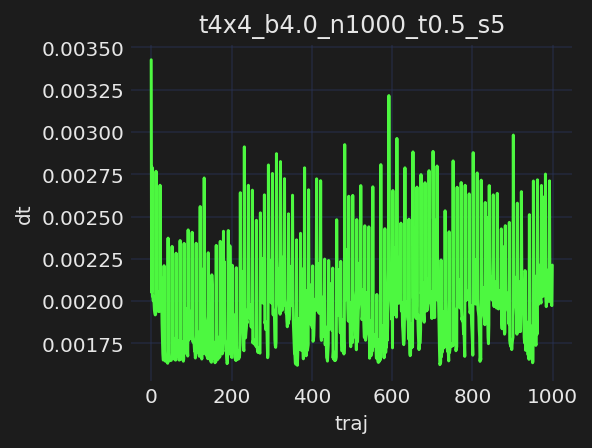

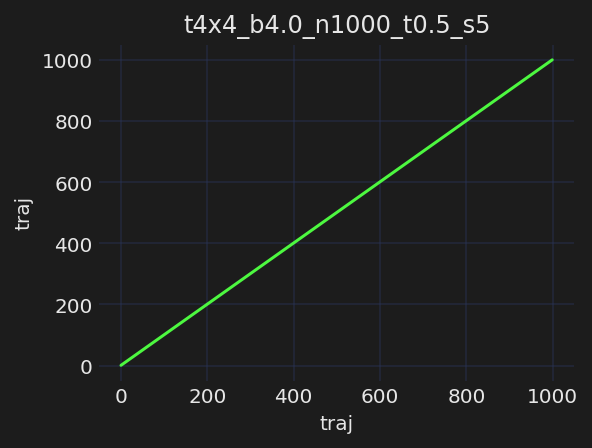

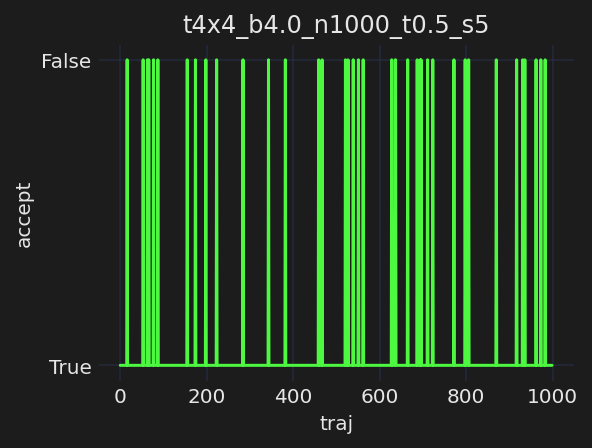

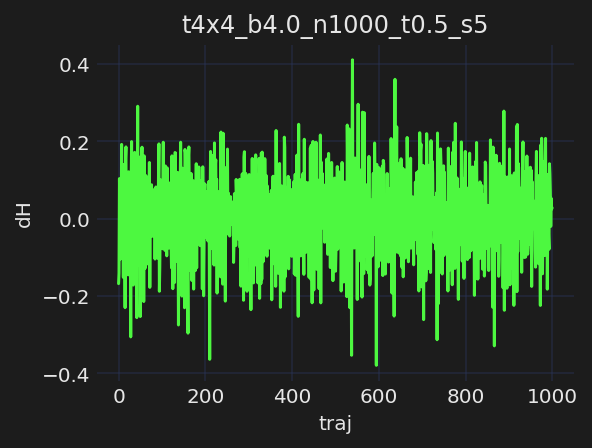

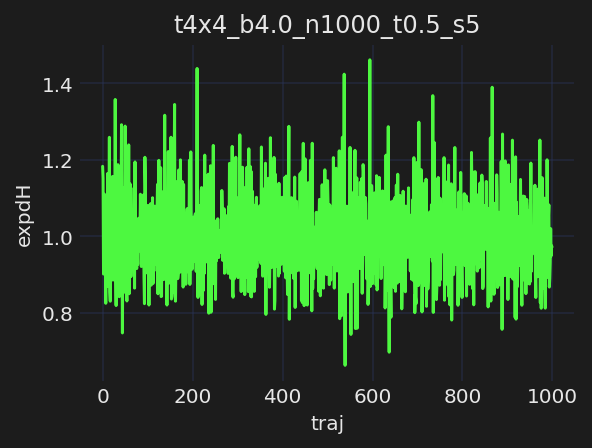

...

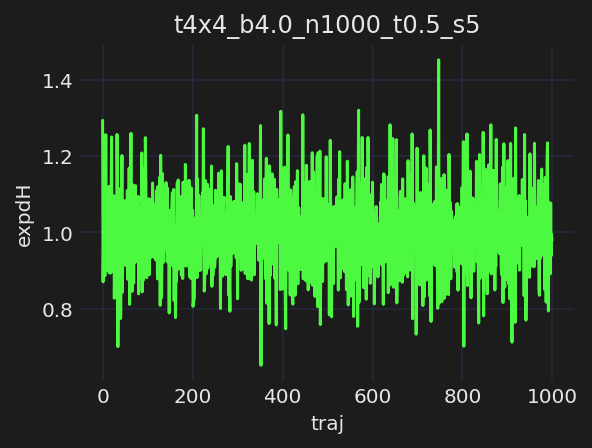

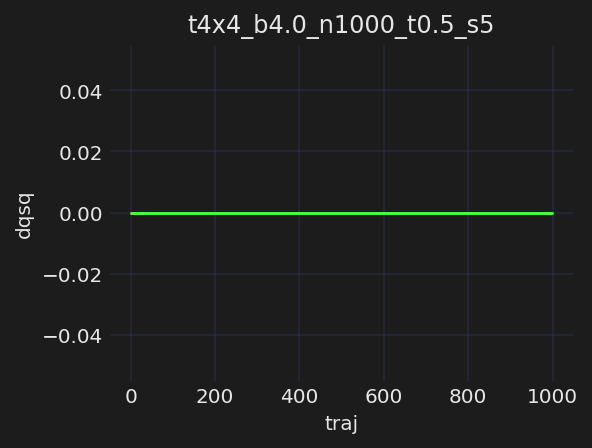

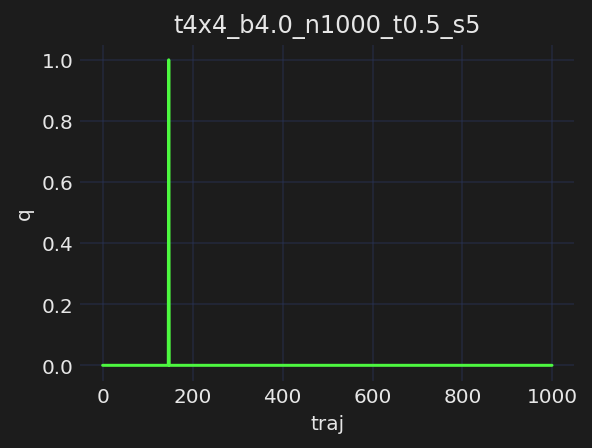

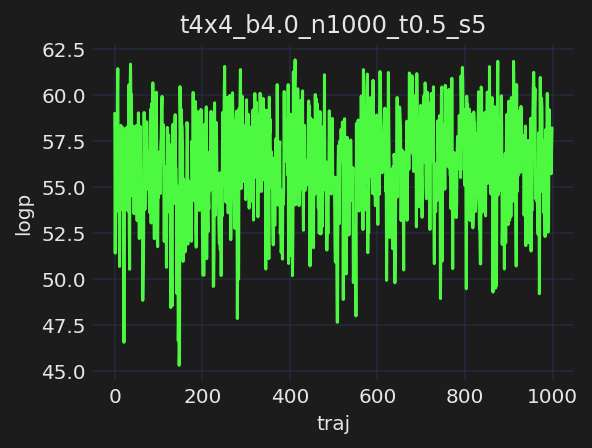

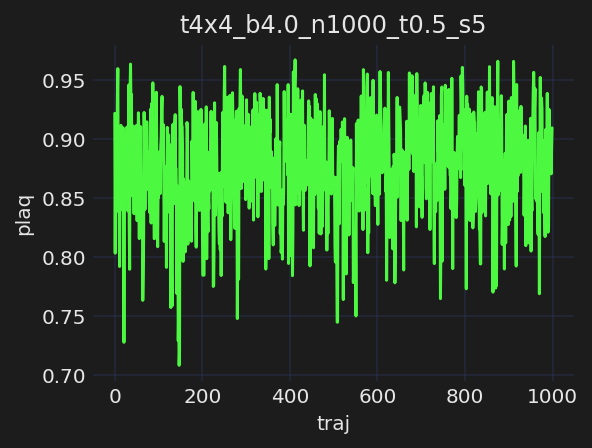

In [5]:
from fthmc.hmc import run_hmc

#hmc_mdir = io.tstamp_dir(os.path.join(logdir, 'hmc'))
#hmc_mdir = io.tstamp_dir(os.path.join(dirs, 'hmc'))

hmc_fields, hmc_history = run_hmc(param,
                                  keep_fields=True,
                                  save_history=True)

## Define `TrainConfig` and build model as
```python
model = {
    'prior': MultivariateUniform(...),
    'model': make_u1_equiv_layers(...),
}
```

### Train `model_init`:

In [6]:
train_config.n_epoch = 100

[22:56:25]  Creating directory: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb6
            4_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100

[22:56:25]  Creating directory: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb6
            4_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training

[22:56:25]  Creating directory: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb6
            4_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/plots

[22:56:25]  Creating directory: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb6
            4_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints

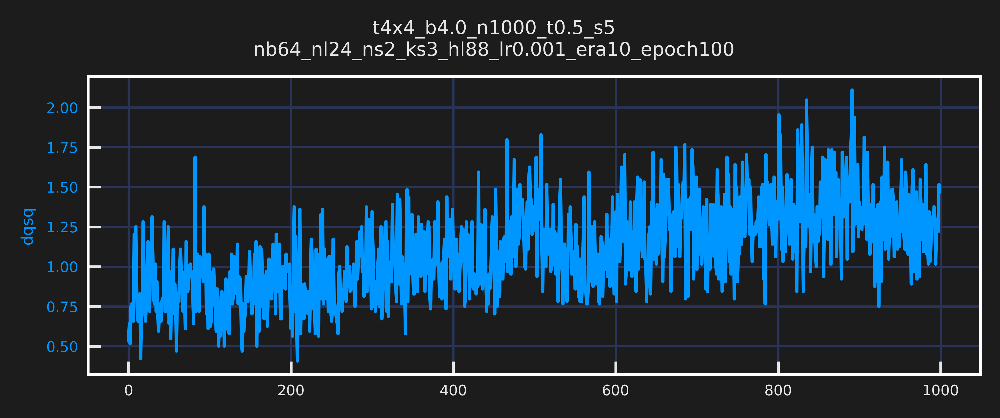

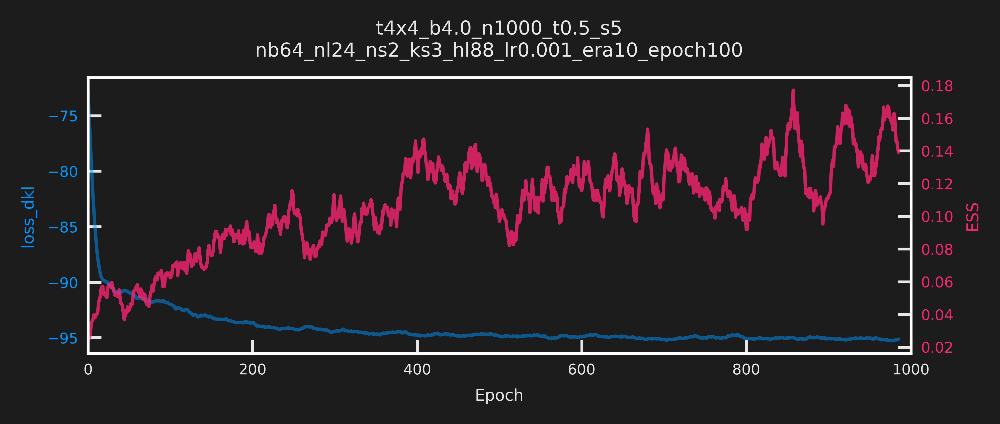

[22:56:26]  -----------------------------                                                    
            ERA=0, last took: 0 min 0 sec                                                    
            -----------------------------

[22:56:29]  epoch=19.000 step=19.000 dt=0.146 loss=-87.645 dqsq=0.841 ess=0.053 plaq=0.569   
            loss_dkl=-87.645 logp=36.402 logq=-51.243

[22:56:33]  epoch=39.000 step=39.000 dt=0.145 loss=-90.671 dqsq=0.734 ess=0.054 plaq=0.745   
            loss_dkl=-90.671 logp=47.703 logq=-42.968

[22:56:37]  epoch=59.000 step=59.000 dt=0.143 loss=-90.417 dqsq=0.800 ess=0.035 plaq=0.682   
            loss_dkl=-90.417 logp=43.647 logq=-46.771

[22:56:41]  epoch=79.000 step=79.000 dt=0.135 loss=-91.418 dqsq=0.963 ess=0.046 plaq=0.728   
            loss_dkl=-91.418 logp=46.578 logq=-44.840

[22:56:45]  epoch=99.000 step=99.000 dt=0.142 loss=-91.401 dqsq=0.863 ess=0.072 plaq=0.719   
            loss_dkl=-91.401 logp=45.998 logq=-45.403

[22:56:46]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era0-epoch
            100.tar

[22:56:46]  ---------------------------------                                                
            ERA=1, last took: 0 min 19.61 sec                                                
            ---------------------------------

[22:56:49]  epoch=19.000 step=119.000 dt=0.149 loss=-92.728 dqsq=0.728 ess=0.066 plaq=0.743  
            loss_dkl=-92.728 logp=47.571 logq=-45.157

[22:56:53]  epoch=39.000 step=139.000 dt=0.149 loss=-93.303 dqsq=0.794 ess=0.089 plaq=0.762  
            loss_dkl=-93.303 logp=48.751 logq=-44.551

[22:56:57]  epoch=59.000 step=159.000 dt=0.162 loss=-93.110 dqsq=0.928 ess=0.097 plaq=0.753  
            loss_dkl=-93.110 logp=48.182 logq=-44.927

[22:57:02]  epoch=79.000 step=179.000 dt=0.170 loss=-93.324 dqsq=0.944 ess=0.091 plaq=0.759  
            loss_dkl=-93.324 logp=48.585 logq=-44.740

[22:57:07]  epoch=99.000 step=199.000 dt=0.199 loss=-93.797 dqsq=0.944 ess=0.108 plaq=0.771  
            loss_dkl=-93.797 logp=49.333 logq=-44.464

[22:57:08]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era1-epoch
            100.tar

[22:57:08]  ---------------------------------                                                
            ERA=2, last took: 0 min 22.26 sec                                                
            ---------------------------------

[22:57:12]  epoch=19.000 step=219.000 dt=0.202 loss=-94.369 dqsq=0.794 ess=0.066 plaq=0.783  
            loss_dkl=-94.369 logp=50.134 logq=-44.235

[22:57:18]  epoch=39.000 step=239.000 dt=0.198 loss=-94.106 dqsq=1.106 ess=0.102 plaq=0.772  
            loss_dkl=-94.106 logp=49.376 logq=-44.730

[22:57:23]  epoch=59.000 step=259.000 dt=0.202 loss=-94.203 dqsq=0.713 ess=0.109 plaq=0.783  
            loss_dkl=-94.203 logp=50.121 logq=-44.082

[22:57:29]  epoch=79.000 step=279.000 dt=0.201 loss=-93.890 dqsq=0.866 ess=0.078 plaq=0.775  
            loss_dkl=-93.890 logp=49.624 logq=-44.267

[22:57:34]  epoch=99.000 step=299.000 dt=0.211 loss=-94.281 dqsq=1.072 ess=0.103 plaq=0.780  
            loss_dkl=-94.281 logp=49.935 logq=-44.345

[22:57:36]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era2-epoch
            100.tar

[22:57:36]  ---------------------------------                                                
            ERA=3, last took: 0 min 27.71 sec                                                
            ---------------------------------

[22:57:40]  epoch=19.000 step=319.000 dt=0.212 loss=-94.311 dqsq=1.053 ess=0.088 plaq=0.782  
            loss_dkl=-94.311 logp=50.053 logq=-44.258

[22:57:46]  epoch=39.000 step=339.000 dt=0.212 loss=-94.508 dqsq=0.963 ess=0.123 plaq=0.789  
            loss_dkl=-94.508 logp=50.504 logq=-44.005

[22:57:52]  epoch=59.000 step=359.000 dt=0.208 loss=-94.681 dqsq=1.094 ess=0.084 plaq=0.795  
            loss_dkl=-94.681 logp=50.868 logq=-43.813

[22:57:58]  epoch=79.000 step=379.000 dt=0.216 loss=-94.520 dqsq=1.069 ess=0.076 plaq=0.794  
            loss_dkl=-94.520 logp=50.807 logq=-43.712

[22:58:04]  epoch=99.000 step=399.000 dt=0.218 loss=-94.590 dqsq=1.188 ess=0.150 plaq=0.790  
            loss_dkl=-94.590 logp=50.548 logq=-44.042

[22:58:05]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era3-epoch
            100.tar

[22:58:06]  ---------------------------------                                                
            ERA=4, last took: 0 min 29.55 sec                                                
            ---------------------------------

[22:58:10]  epoch=19.000 step=419.000 dt=0.223 loss=-95.018 dqsq=1.109 ess=0.134 plaq=0.790  
            loss_dkl=-95.018 logp=50.529 logq=-44.490

[22:58:17]  epoch=39.000 step=439.000 dt=0.225 loss=-94.537 dqsq=1.062 ess=0.141 plaq=0.796  
            loss_dkl=-94.537 logp=50.945 logq=-43.592

[22:58:23]  epoch=59.000 step=459.000 dt=0.243 loss=-95.028 dqsq=1.012 ess=0.106 plaq=0.800  
            loss_dkl=-95.028 logp=51.190 logq=-43.838

[22:58:30]  epoch=79.000 step=479.000 dt=0.231 loss=-94.823 dqsq=1.269 ess=0.164 plaq=0.798  
            loss_dkl=-94.823 logp=51.056 logq=-43.767

[22:58:36]  epoch=99.000 step=499.000 dt=0.229 loss=-94.465 dqsq=1.316 ess=0.101 plaq=0.796  
            loss_dkl=-94.465 logp=50.963 logq=-43.501

[22:58:38]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era4-epoch
            100.tar

[22:58:38]  ---------------------------------                                                
            ERA=5, last took: 0 min 32.17 sec                                                
            ---------------------------------

[22:58:43]  epoch=19.000 step=519.000 dt=0.233 loss=-94.886 dqsq=1.234 ess=0.123 plaq=0.803  
            loss_dkl=-94.886 logp=51.409 logq=-43.477

[22:58:49]  epoch=39.000 step=539.000 dt=0.229 loss=-94.780 dqsq=1.016 ess=0.106 plaq=0.808  
            loss_dkl=-94.780 logp=51.686 logq=-43.094

[22:58:55]  epoch=59.000 step=559.000 dt=0.230 loss=-94.678 dqsq=0.906 ess=0.083 plaq=0.800  
            loss_dkl=-94.678 logp=51.186 logq=-43.492

[22:59:01]  epoch=79.000 step=579.000 dt=0.218 loss=-95.045 dqsq=0.947 ess=0.085 plaq=0.802  
            loss_dkl=-95.045 logp=51.323 logq=-43.723

[22:59:08]  epoch=99.000 step=599.000 dt=0.207 loss=-94.951 dqsq=1.075 ess=0.161 plaq=0.803  
            loss_dkl=-94.951 logp=51.408 logq=-43.543

[22:59:09]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era5-epoch
            100.tar

[22:59:09]  ---------------------------------                                                
            ERA=6, last took: 0 min 31.24 sec                                                
            ---------------------------------

[22:59:13]  epoch=19.000 step=619.000 dt=0.215 loss=-94.590 dqsq=1.075 ess=0.126 plaq=0.790  
            loss_dkl=-94.590 logp=50.589 logq=-44.001

[22:59:19]  epoch=39.000 step=639.000 dt=0.207 loss=-94.964 dqsq=1.081 ess=0.101 plaq=0.800  
            loss_dkl=-94.964 logp=51.188 logq=-43.776

[22:59:25]  epoch=59.000 step=659.000 dt=0.209 loss=-95.006 dqsq=1.306 ess=0.076 plaq=0.802  
            loss_dkl=-95.006 logp=51.351 logq=-43.655

[22:59:30]  epoch=79.000 step=679.000 dt=0.205 loss=-95.004 dqsq=1.306 ess=0.097 plaq=0.806  
            loss_dkl=-95.004 logp=51.561 logq=-43.442

[22:59:36]  epoch=99.000 step=699.000 dt=0.192 loss=-94.988 dqsq=1.375 ess=0.081 plaq=0.798  
            loss_dkl=-94.988 logp=51.101 logq=-43.887

[22:59:37]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era6-epoch
            100.tar

[22:59:37]  ---------------------------------                                                
            ERA=7, last took: 0 min 27.93 sec                                                
            ---------------------------------

[22:59:41]  epoch=19.000 step=719.000 dt=0.188 loss=-95.264 dqsq=1.212 ess=0.143 plaq=0.811  
            loss_dkl=-95.264 logp=51.876 logq=-43.388

[22:59:46]  epoch=39.000 step=739.000 dt=0.183 loss=-95.104 dqsq=1.303 ess=0.131 plaq=0.811  
            loss_dkl=-95.104 logp=51.908 logq=-43.196

[22:59:51]  epoch=59.000 step=759.000 dt=0.176 loss=-95.135 dqsq=1.306 ess=0.100 plaq=0.807  
            loss_dkl=-95.135 logp=51.631 logq=-43.504

[22:59:56]  epoch=79.000 step=779.000 dt=0.170 loss=-95.084 dqsq=1.247 ess=0.129 plaq=0.802  
            loss_dkl=-95.084 logp=51.324 logq=-43.760

[23:00:01]  epoch=99.000 step=799.000 dt=0.170 loss=-94.709 dqsq=1.309 ess=0.126 plaq=0.800  
            loss_dkl=-94.709 logp=51.170 logq=-43.539

[23:00:02]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era7-epoch
            100.tar

[23:00:02]  ---------------------------------                                                
            ERA=8, last took: 0 min 24.85 sec                                                
            ---------------------------------

[23:00:06]  epoch=19.000 step=819.000 dt=0.171 loss=-95.000 dqsq=1.334 ess=0.129 plaq=0.804  
            loss_dkl=-95.000 logp=51.443 logq=-43.557

[23:00:10]  epoch=39.000 step=839.000 dt=0.171 loss=-95.271 dqsq=1.522 ess=0.140 plaq=0.810  
            loss_dkl=-95.271 logp=51.822 logq=-43.449

[23:00:15]  epoch=59.000 step=859.000 dt=0.163 loss=-95.018 dqsq=1.450 ess=0.168 plaq=0.800  
            loss_dkl=-95.018 logp=51.207 logq=-43.810

[23:00:20]  epoch=79.000 step=879.000 dt=0.164 loss=-95.040 dqsq=1.288 ess=0.111 plaq=0.807  
            loss_dkl=-95.040 logp=51.670 logq=-43.370

[23:00:24]  epoch=99.000 step=899.000 dt=0.165 loss=-94.950 dqsq=1.397 ess=0.136 plaq=0.804  
            loss_dkl=-94.950 logp=51.432 logq=-43.518

[23:00:25]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era8-epoch
            100.tar

[23:00:25]  ---------------------------------                                                
            ERA=9, last took: 0 min 23.14 sec                                                
            ---------------------------------

[23:00:29]  epoch=19.000 step=919.000 dt=0.164 loss=-95.032 dqsq=1.250 ess=0.149 plaq=0.798  
            loss_dkl=-95.032 logp=51.075 logq=-43.958

[23:00:33]  epoch=39.000 step=939.000 dt=0.171 loss=-95.061 dqsq=1.309 ess=0.156 plaq=0.804  
            loss_dkl=-95.061 logp=51.430 logq=-43.631

[23:00:38]  epoch=59.000 step=959.000 dt=0.164 loss=-94.919 dqsq=1.288 ess=0.111 plaq=0.798  
            loss_dkl=-94.919 logp=51.084 logq=-43.835

[23:00:43]  epoch=79.000 step=979.000 dt=0.165 loss=-95.334 dqsq=1.312 ess=0.157 plaq=0.800  
            loss_dkl=-95.334 logp=51.192 logq=-44.142

[23:00:47]  epoch=99.000 step=999.000 dt=0.171 loss=-94.957 dqsq=1.347 ess=0.118 plaq=0.793  
            loss_dkl=-94.957 logp=50.726 logq=-44.231

[23:00:49]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era9-epoch
            100.tar

            Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era9-epoch
            100.tar

[23:00:49]  Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/plots/dqsq_live.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/plots/dkl_live.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/plots/dt.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/plots/loss.pdf

[23:00:50]  Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/plots/q.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/plots/dqsq.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/plots/ess.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/plots/plaq.pdf

[23:00:51]  Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/plots/loss_dkl.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/plots/logp.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/plots/logq.pdf

[23:00:51]  Saving train_history to /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5
            /nb64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/train_history.z.

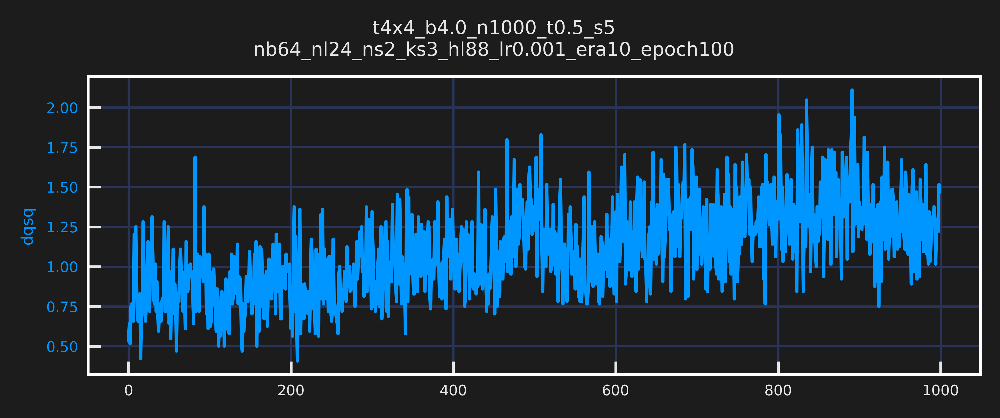

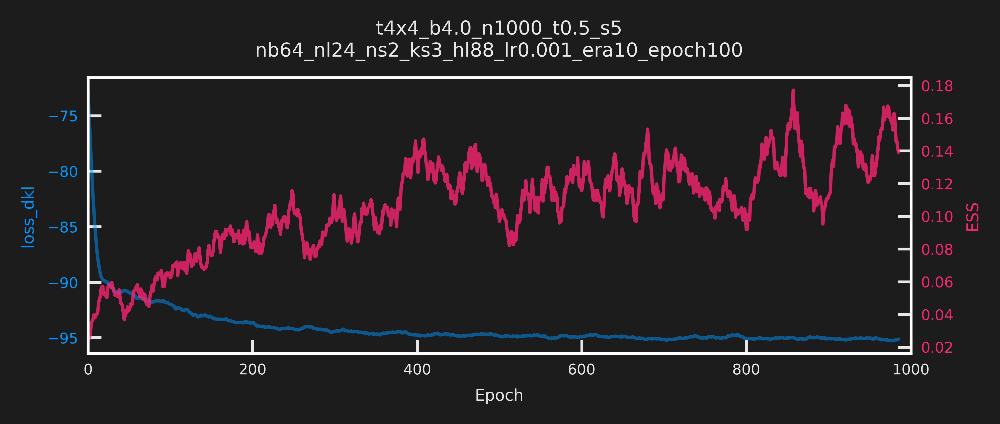

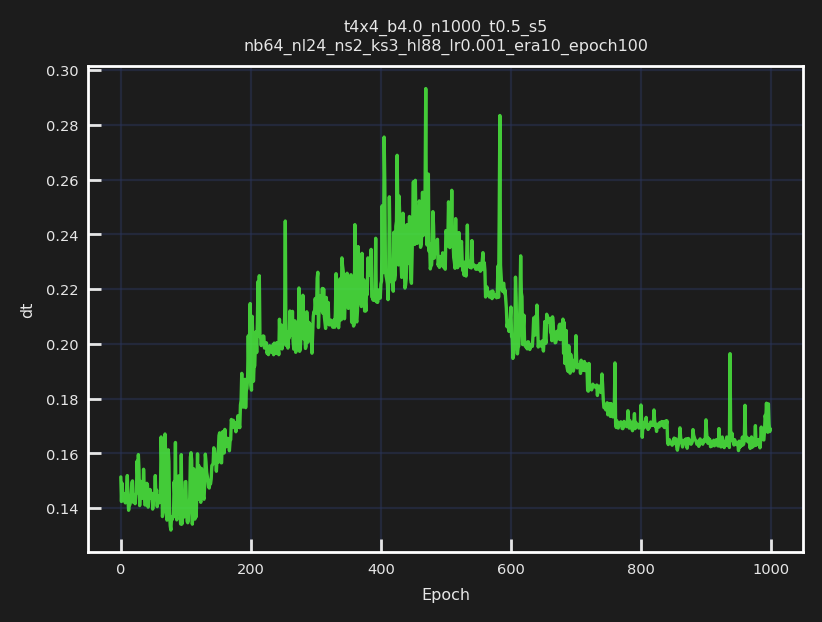

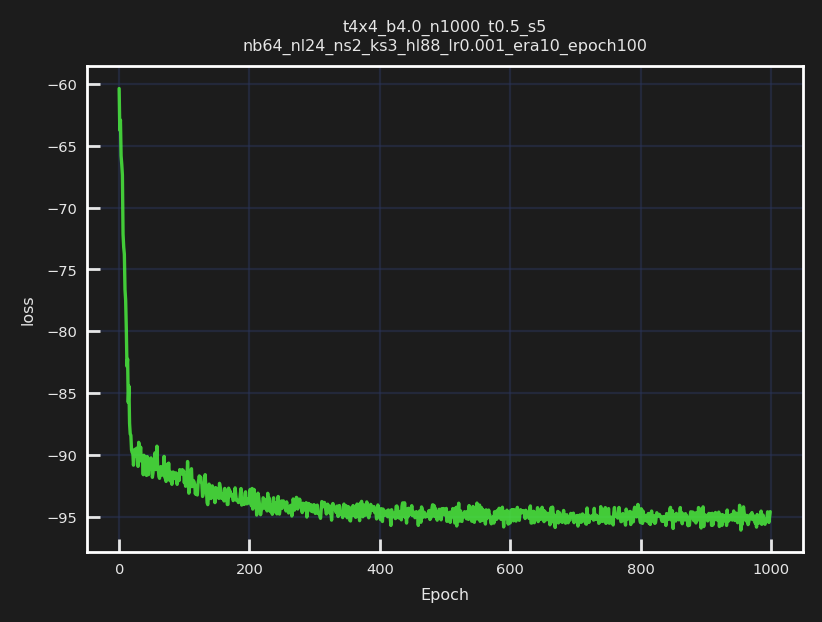

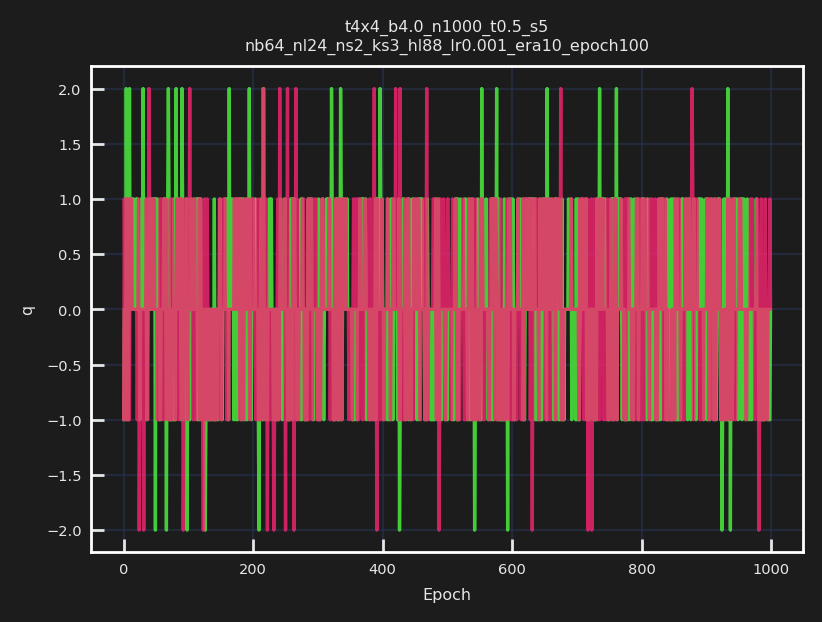

...

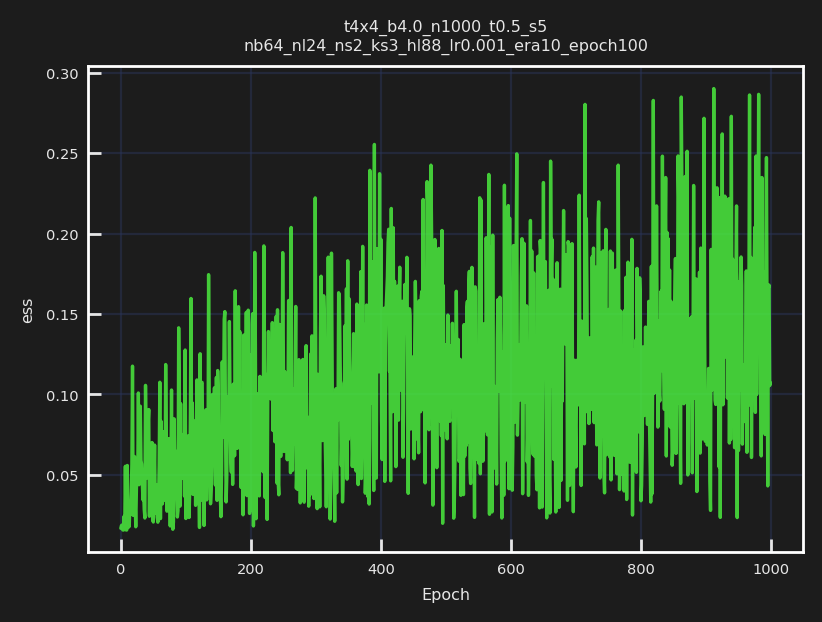

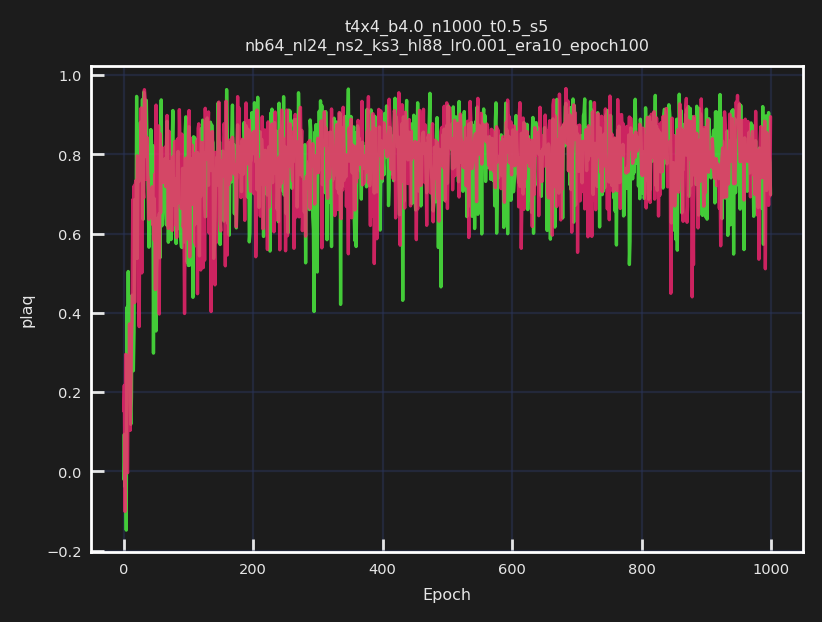

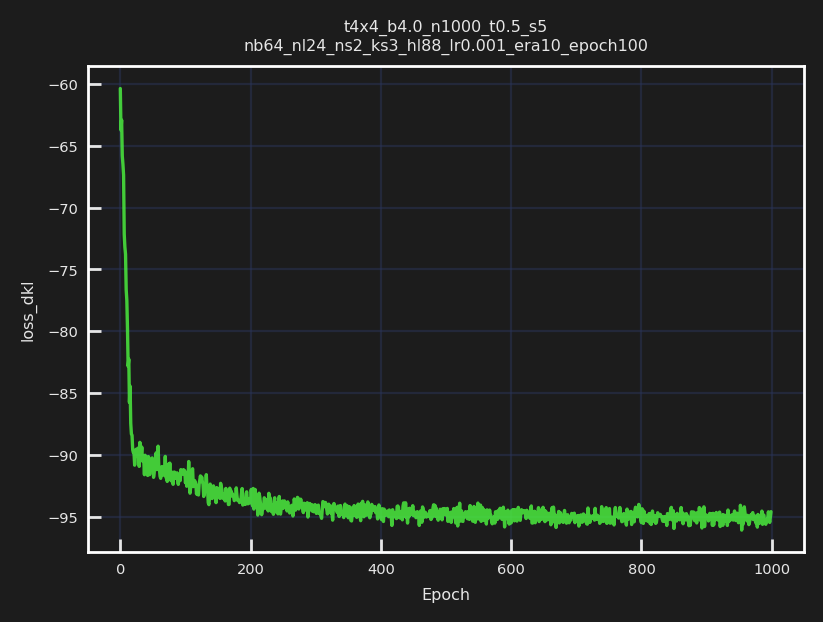

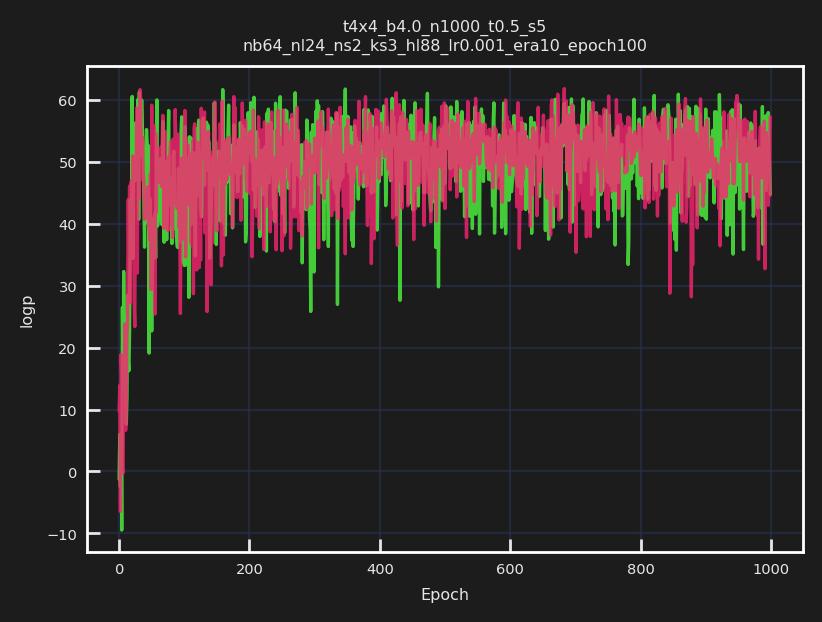

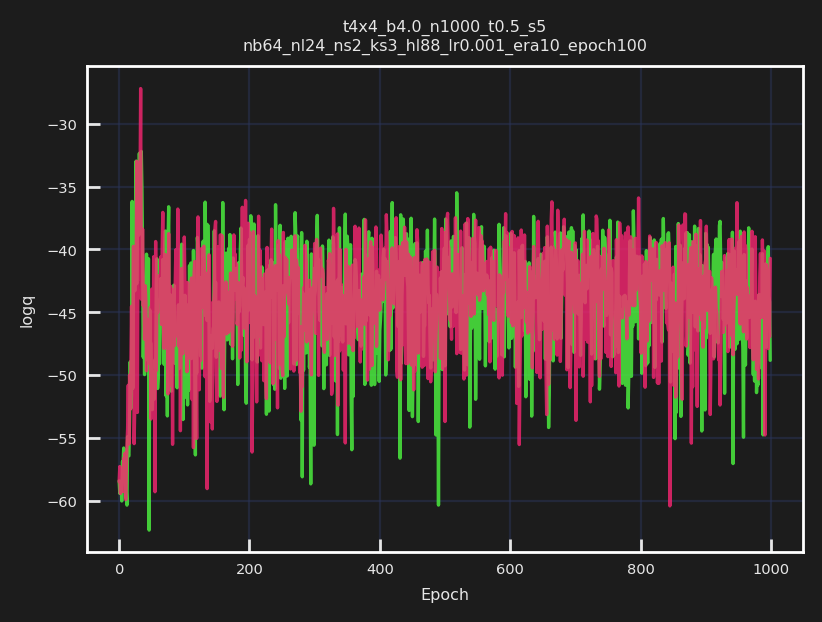

In [7]:
from fthmc.train import train

%matplotlib inline
plt.style.use('default')
plt.style.use('/Users/saforem2/.matplotlib/stylelib/molokai.mplstyle')
sns.set_context('paper', font_scale=0.6)

train_outputs = train(param,
                      train_config,
                      pre_model=None,
                      figsize=(5, 2))

pre_flow_plots = train_outputs['plots']
pre_flow_history = train_outputs['history']
flow_act = train_outputs['action']
pre_flow_model = train_outputs['model']
pre_flow_optimizer = train_outputs['optimizer']

## Run inference on trained model and plot history

/Users/saforem2/nftqcd/fthmc/fthmc/utils/samplers.py:133: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  arr = np.array(val)
/Users/saforem2/nftqcd/fthmc/fthmc/utils/samplers.py:133: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(val)


[23:01:32]  Creating directory: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb6
            4_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/inference/plots

[23:01:32]  Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/inference/plots/ess.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/inference/plots/q.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/inference/plots/dqsq.pdf

[23:01:33]  Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/inference/plots/dkl.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/inference/plots/logq.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/inference/plots/logp.pdf

            Saving figure to: /Users/saforem2/nftqcd/fthmc/logs/t4x4_b4.0_n1000_t0.5_s5/nb64_
            nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/inference/plots/accepted.pdf

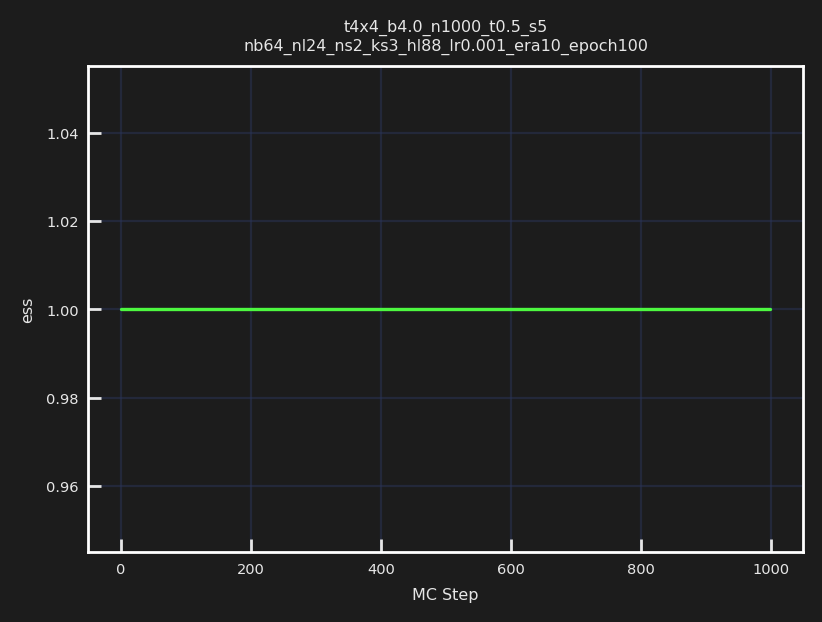

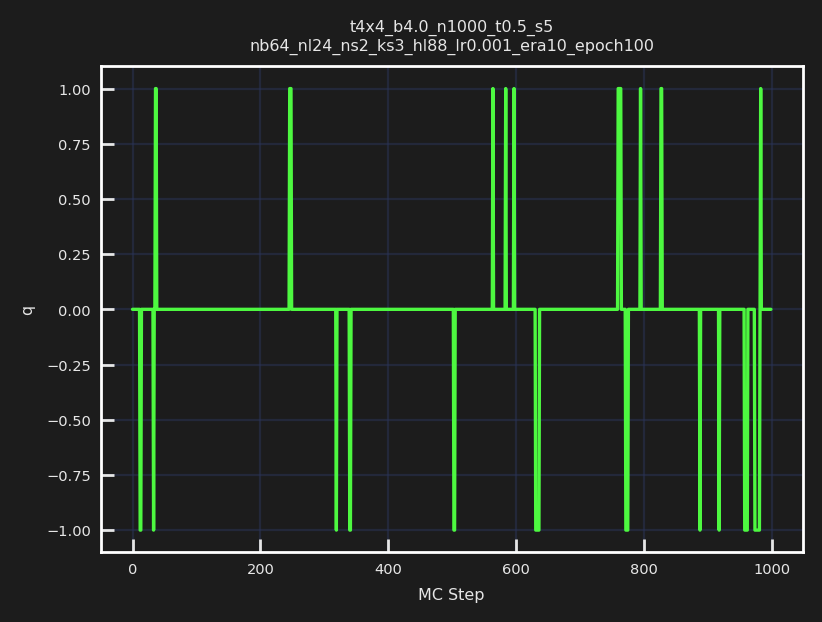

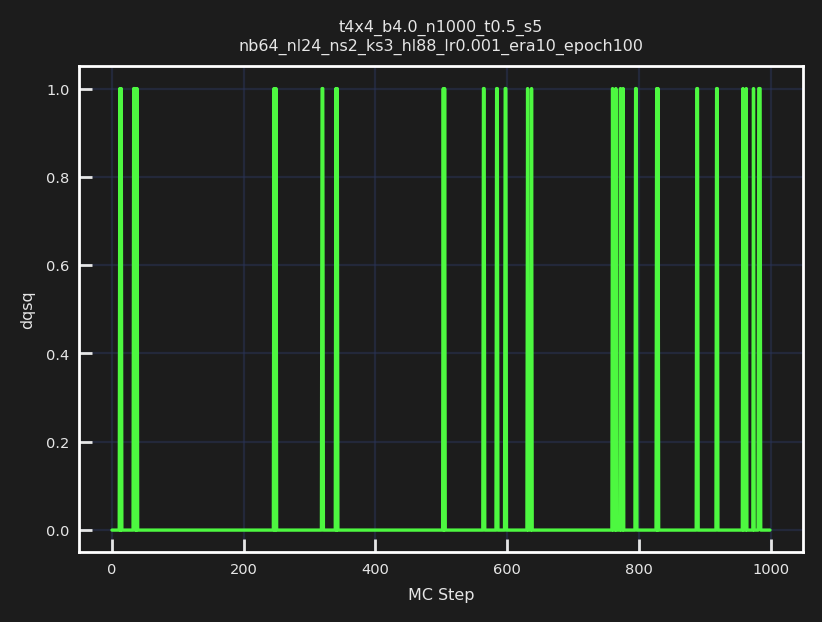

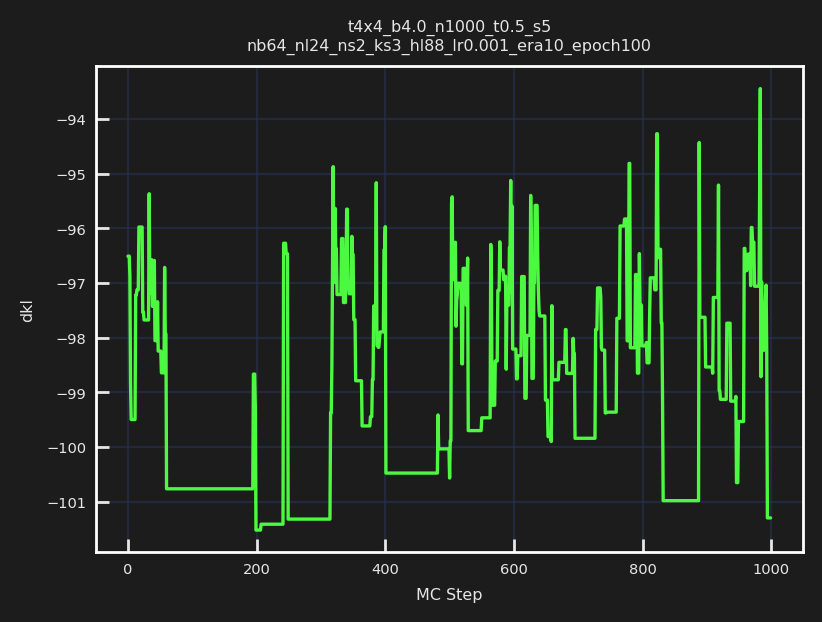

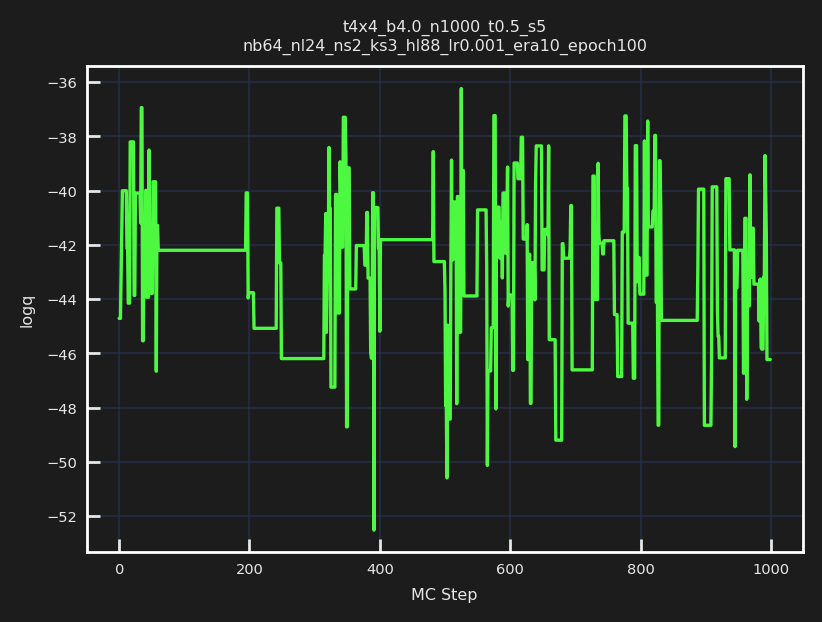

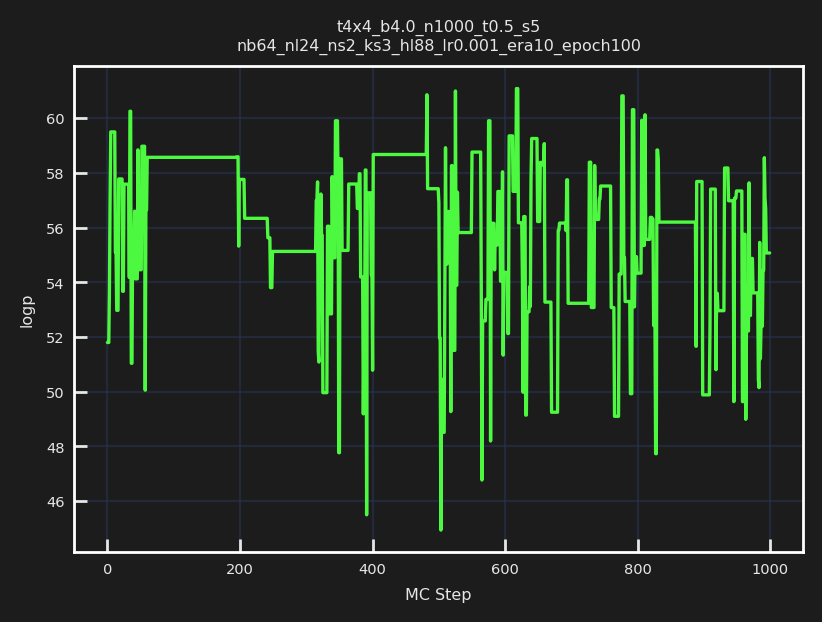

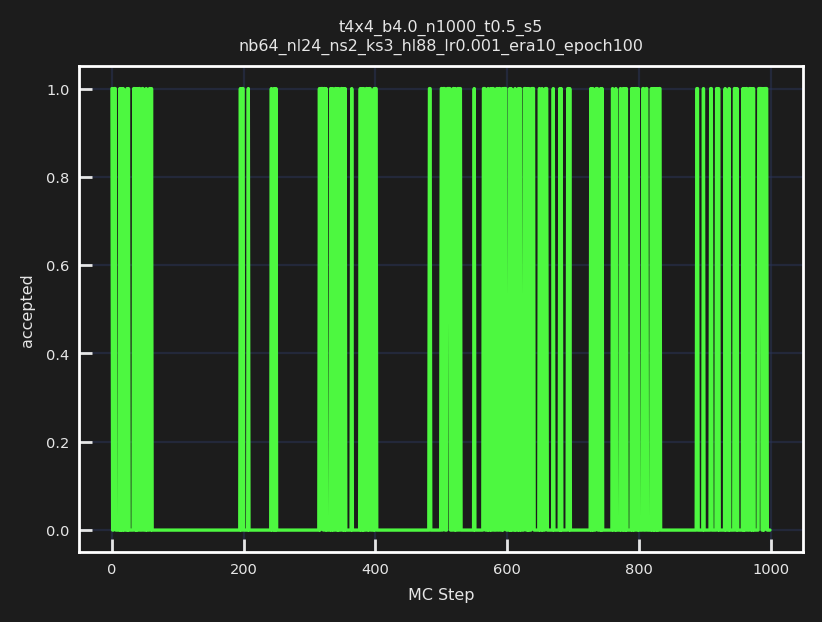

In [8]:
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

action_fn = qed.BatchAction(param.beta)
dirs = train_outputs['dirs']
logdir = dirs['logdir']

inf_dir = os.path.join(logdir, 'inference')
inf_pdir = os.path.join(inf_dir, 'plots')
history = make_mcmc_ensemble(model=train_outputs['model'], action_fn=action_fn,
                             batch_size=train_config.batch_size, num_samples=1000)
plot_history(history=history,
             param=param, config=train_config, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir)

### Transfer to new lattice

[23:02:20]  Creating directory: /Users/saforem2/nftqcd/fthmc/logs/t6x6_b4.0_n1000_t0.5_s5/nb6
            4_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100

[23:02:20]  Creating directory: /Users/saforem2/nftqcd/fthmc/logs/t6x6_b4.0_n1000_t0.5_s5/nb6
            4_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training

[23:02:20]  Creating directory: /Users/saforem2/nftqcd/fthmc/logs/t6x6_b4.0_n1000_t0.5_s5/nb6
            4_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/plots

[23:02:20]  Creating directory: /Users/saforem2/nftqcd/fthmc/logs/t6x6_b4.0_n1000_t0.5_s5/nb6
            4_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints

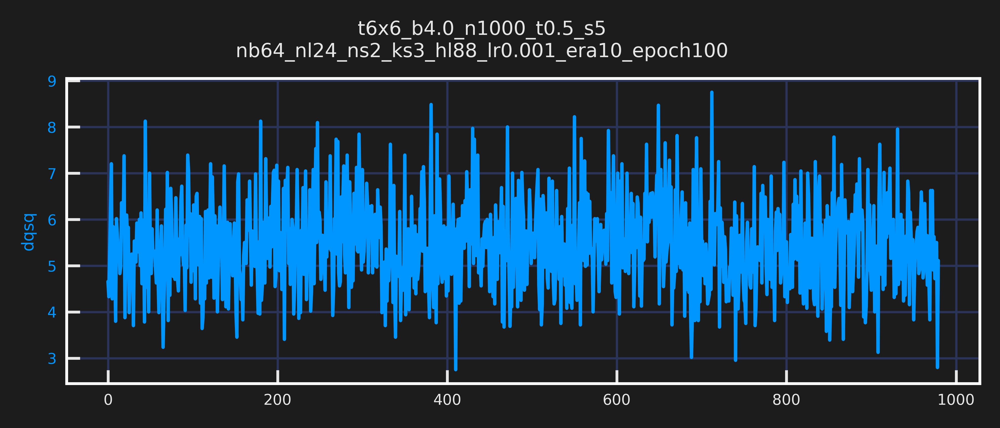

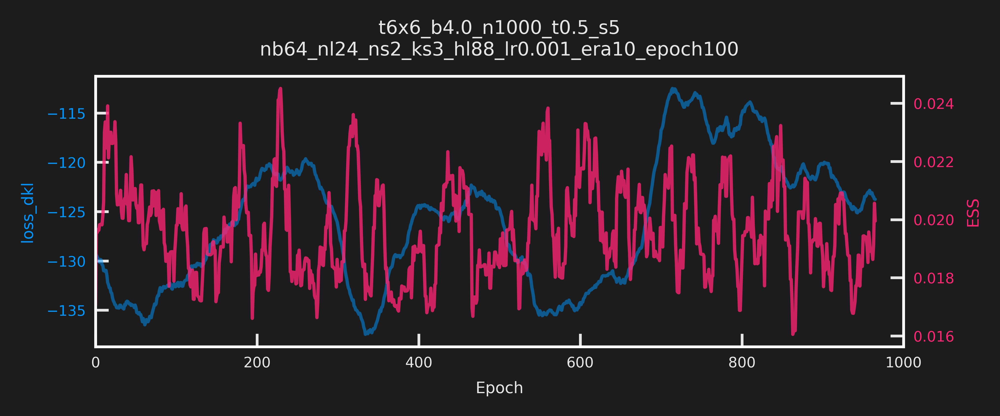

[23:02:21]  -----------------------------                                                    
            ERA=0, last took: 0 min 0 sec                                                    
            -----------------------------

[23:02:25]  epoch=19.000 step=19.000 dt=0.209 loss=-130.991 dqsq=6.100 ess=0.025 plaq=0.160  
            loss_dkl=-130.991 logp=22.981 logq=-108.010

[23:02:30]  epoch=39.000 step=39.000 dt=0.199 loss=-135.770 dqsq=5.647 ess=0.019 plaq=0.201  
            loss_dkl=-135.770 logp=29.001 logq=-106.769

[23:02:36]  epoch=59.000 step=59.000 dt=0.218 loss=-134.358 dqsq=5.181 ess=0.026 plaq=0.204  
            loss_dkl=-134.358 logp=29.358 logq=-105.000

[23:02:42]  epoch=79.000 step=79.000 dt=0.232 loss=-136.518 dqsq=5.122 ess=0.020 plaq=0.224  
            loss_dkl=-136.518 logp=32.211 logq=-104.306

[23:02:48]  epoch=99.000 step=99.000 dt=0.263 loss=-132.916 dqsq=5.856 ess=0.020 plaq=0.214  
            loss_dkl=-132.916 logp=30.850 logq=-102.065

[23:02:50]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t6x6_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era0-epoch
            100.tar

[23:02:50]  ---------------------------------                                                
            ERA=1, last took: 0 min 28.46 sec                                                
            ---------------------------------

[23:02:55]  epoch=19.000 step=119.000 dt=0.281 loss=-132.394 dqsq=5.544 ess=0.018 plaq=0.213 
            loss_dkl=-132.394 logp=30.718 logq=-101.676

[23:03:02]  epoch=39.000 step=139.000 dt=0.272 loss=-131.045 dqsq=5.300 ess=0.018 plaq=0.217 
            loss_dkl=-131.045 logp=31.295 logq=-99.750

[23:03:09]  epoch=59.000 step=159.000 dt=0.281 loss=-127.323 dqsq=4.478 ess=0.017 plaq=0.209 
            loss_dkl=-127.323 logp=30.100 logq=-97.222

[23:03:17]  epoch=79.000 step=179.000 dt=0.303 loss=-127.132 dqsq=4.709 ess=0.019 plaq=0.214 
            loss_dkl=-127.132 logp=30.772 logq=-96.360

[23:03:25]  epoch=99.000 step=199.000 dt=0.307 loss=-122.203 dqsq=6.109 ess=0.018 plaq=0.185 
            loss_dkl=-122.203 logp=26.663 logq=-95.539

[23:03:26]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t6x6_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era1-epoch
            100.tar

[23:03:26]  ---------------------------------                                                
            ERA=2, last took: 0 min 36.61 sec                                                
            ---------------------------------

[23:03:32]  epoch=19.000 step=219.000 dt=0.293 loss=-119.847 dqsq=5.112 ess=0.017 plaq=0.166 
            loss_dkl=-119.847 logp=23.879 logq=-95.968

[23:03:40]  epoch=39.000 step=239.000 dt=0.293 loss=-121.235 dqsq=5.287 ess=0.024 plaq=0.161 
            loss_dkl=-121.235 logp=23.113 logq=-98.122

[23:03:48]  epoch=59.000 step=259.000 dt=0.307 loss=-122.392 dqsq=5.513 ess=0.017 plaq=0.163 
            loss_dkl=-122.392 logp=23.403 logq=-98.989

[23:03:55]  epoch=79.000 step=279.000 dt=0.273 loss=-120.841 dqsq=6.172 ess=0.016 plaq=0.159 
            loss_dkl=-120.841 logp=22.851 logq=-97.990

[23:04:02]  epoch=99.000 step=299.000 dt=0.270 loss=-124.486 dqsq=6.047 ess=0.020 plaq=0.167 
            loss_dkl=-124.486 logp=24.074 logq=-100.412

[23:04:03]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t6x6_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era2-epoch
            100.tar

[23:04:03]  ---------------------------------                                                
            ERA=3, last took: 0 min 36.66 sec                                                
            ---------------------------------

[23:04:08]  epoch=19.000 step=319.000 dt=0.262 loss=-131.307 dqsq=5.906 ess=0.020 plaq=0.185 
            loss_dkl=-131.307 logp=26.612 logq=-104.695

[23:04:15]  epoch=39.000 step=339.000 dt=0.260 loss=-136.760 dqsq=4.969 ess=0.018 plaq=0.202 
            loss_dkl=-136.760 logp=29.142 logq=-107.618

[23:04:22]  epoch=59.000 step=359.000 dt=0.262 loss=-136.094 dqsq=5.269 ess=0.025 plaq=0.211 
            loss_dkl=-136.094 logp=30.319 logq=-105.775

[23:04:29]  epoch=79.000 step=379.000 dt=0.259 loss=-128.939 dqsq=4.728 ess=0.018 plaq=0.174 
            loss_dkl=-128.939 logp=25.034 logq=-103.905

[23:04:35]  epoch=99.000 step=399.000 dt=0.258 loss=-126.419 dqsq=5.175 ess=0.016 plaq=0.188 
            loss_dkl=-126.419 logp=27.009 logq=-99.411

[23:04:37]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t6x6_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era3-epoch
            100.tar

[23:04:37]  ---------------------------------                                                
            ERA=4, last took: 0 min 33.68 sec                                                
            ---------------------------------

[23:04:42]  epoch=19.000 step=419.000 dt=0.259 loss=-124.068 dqsq=5.509 ess=0.019 plaq=0.176 
            loss_dkl=-124.068 logp=25.272 logq=-98.796

[23:04:49]  epoch=39.000 step=439.000 dt=0.287 loss=-126.467 dqsq=5.575 ess=0.020 plaq=0.193 
            loss_dkl=-126.467 logp=27.720 logq=-98.747

[23:04:57]  epoch=59.000 step=459.000 dt=0.302 loss=-125.011 dqsq=5.297 ess=0.020 plaq=0.206 
            loss_dkl=-125.011 logp=29.601 logq=-95.410

[23:05:05]  epoch=79.000 step=479.000 dt=0.300 loss=-121.015 dqsq=5.166 ess=0.017 plaq=0.199 
            loss_dkl=-121.015 logp=28.677 logq=-92.339

[23:05:13]  epoch=99.000 step=499.000 dt=0.294 loss=-125.167 dqsq=5.763 ess=0.017 plaq=0.224 
            loss_dkl=-125.167 logp=32.321 logq=-92.846

[23:05:14]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t6x6_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era4-epoch
            100.tar

[23:05:14]  ---------------------------------                                                
            ERA=5, last took: 0 min 37.37 sec                                                
            ---------------------------------

[23:05:20]  epoch=19.000 step=519.000 dt=0.298 loss=-128.934 dqsq=5.181 ess=0.022 plaq=0.207 
            loss_dkl=-128.934 logp=29.751 logq=-99.182

[23:05:28]  epoch=39.000 step=539.000 dt=0.292 loss=-130.645 dqsq=5.147 ess=0.016 plaq=0.200 
            loss_dkl=-130.645 logp=28.834 logq=-101.811

[23:05:35]  epoch=59.000 step=559.000 dt=0.282 loss=-135.704 dqsq=5.741 ess=0.017 plaq=0.204 
            loss_dkl=-135.704 logp=29.368 logq=-106.337

[23:05:43]  epoch=79.000 step=579.000 dt=0.278 loss=-135.389 dqsq=5.397 ess=0.017 plaq=0.202 
            loss_dkl=-135.389 logp=29.074 logq=-106.315

[23:05:50]  epoch=99.000 step=599.000 dt=0.296 loss=-135.042 dqsq=5.566 ess=0.025 plaq=0.205 
            loss_dkl=-135.042 logp=29.558 logq=-105.484

[23:05:52]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t6x6_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era5-epoch
            100.tar

[23:05:52]  ---------------------------------                                                
            ERA=6, last took: 0 min 37.53 sec                                                
            ---------------------------------

[23:05:58]  epoch=19.000 step=619.000 dt=0.287 loss=-133.170 dqsq=5.897 ess=0.018 plaq=0.203 
            loss_dkl=-133.170 logp=29.194 logq=-103.976

[23:06:05]  epoch=39.000 step=639.000 dt=0.276 loss=-132.714 dqsq=6.384 ess=0.016 plaq=0.208 
            loss_dkl=-132.714 logp=29.971 logq=-102.744

[23:06:12]  epoch=59.000 step=659.000 dt=0.270 loss=-133.330 dqsq=5.528 ess=0.023 plaq=0.204 
            loss_dkl=-133.330 logp=29.406 logq=-103.924

[23:06:19]  epoch=79.000 step=679.000 dt=0.275 loss=-130.150 dqsq=5.722 ess=0.019 plaq=0.182 
            loss_dkl=-130.150 logp=26.143 logq=-104.006

[23:06:26]  epoch=99.000 step=699.000 dt=0.264 loss=-122.658 dqsq=5.144 ess=0.021 plaq=0.157 
            loss_dkl=-122.658 logp=22.538 logq=-100.120

[23:06:27]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t6x6_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era6-epoch
            100.tar

[23:06:27]  ---------------------------------                                                
            ERA=7, last took: 0 min 35.42 sec                                                
            ---------------------------------

[23:06:33]  epoch=19.000 step=719.000 dt=0.263 loss=-113.508 dqsq=5.847 ess=0.024 plaq=0.130 
            loss_dkl=-113.508 logp=18.728 logq=-94.780

[23:06:39]  epoch=39.000 step=739.000 dt=0.261 loss=-114.709 dqsq=5.281 ess=0.020 plaq=0.146 
            loss_dkl=-114.709 logp=20.990 logq=-93.719

[23:06:46]  epoch=59.000 step=759.000 dt=0.273 loss=-113.146 dqsq=5.019 ess=0.017 plaq=0.127 
            loss_dkl=-113.146 logp=18.342 logq=-94.805

[23:06:53]  epoch=79.000 step=779.000 dt=0.271 loss=-118.768 dqsq=5.378 ess=0.025 plaq=0.153 
            loss_dkl=-118.768 logp=22.058 logq=-96.710

[23:07:01]  epoch=99.000 step=799.000 dt=0.317 loss=-118.167 dqsq=5.487 ess=0.020 plaq=0.143 
            loss_dkl=-118.167 logp=20.642 logq=-97.525

[23:07:03]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t6x6_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era7-epoch
            100.tar

[23:07:03]  ---------------------------------                                                
            ERA=8, last took: 0 min 35.33 sec                                                
            ---------------------------------

[23:07:09]  epoch=19.000 step=819.000 dt=0.294 loss=-114.560 dqsq=5.456 ess=0.019 plaq=0.158 
            loss_dkl=-114.560 logp=22.744 logq=-91.816

[23:07:17]  epoch=39.000 step=839.000 dt=0.295 loss=-114.943 dqsq=5.600 ess=0.020 plaq=0.144 
            loss_dkl=-114.943 logp=20.799 logq=-94.144

[23:07:24]  epoch=59.000 step=859.000 dt=0.292 loss=-121.205 dqsq=5.794 ess=0.021 plaq=0.169 
            loss_dkl=-121.205 logp=24.287 logq=-96.918

[23:07:32]  epoch=79.000 step=879.000 dt=0.291 loss=-120.941 dqsq=5.153 ess=0.016 plaq=0.177 
            loss_dkl=-120.941 logp=25.517 logq=-95.424

[23:07:39]  epoch=99.000 step=899.000 dt=0.285 loss=-121.371 dqsq=5.647 ess=0.019 plaq=0.188 
            loss_dkl=-121.371 logp=27.129 logq=-94.242

[23:07:40]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t6x6_b4.0_n1000_t0.5_s5/n
            b64_nl24_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpoints/ckpt-era8-epoch
            100.tar

[23:07:41]  ---------------------------------                                                
            ERA=9, last took: 0 min 37.61 sec                                                
            ---------------------------------

[23:07:46]  epoch=19.000 step=919.000 dt=0.265 loss=-120.405 dqsq=6.009 ess=0.020 plaq=0.183 
            loss_dkl=-120.405 logp=26.408 logq=-93.997

[23:07:53]  epoch=39.000 step=939.000 dt=0.259 loss=-124.366 dqsq=5.253 ess=0.019 plaq=0.188 
            loss_dkl=-124.366 logp=27.015 logq=-97.351

[23:07:59]  epoch=59.000 step=959.000 dt=0.249 loss=-124.970 dqsq=5.609 ess=0.020 plaq=0.188 
            loss_dkl=-124.970 logp=27.016 logq=-97.953

[23:08:06]  epoch=79.000 step=979.000 dt=0.245 loss=-124.773 dqsq=4.650 ess=0.024 plaq=0.192 
            loss_dkl=-124.773 logp=27.598 logq=-97.175

[23:08:13]  epoch=99.000 step=999.000 dt=0.262 loss=-124.599 dqsq=6.091 ess=0.016 plaq=0.180 
            loss_dkl=-124.599 logp=25.879 logq=-98.720

KeyboardInterrupt: 

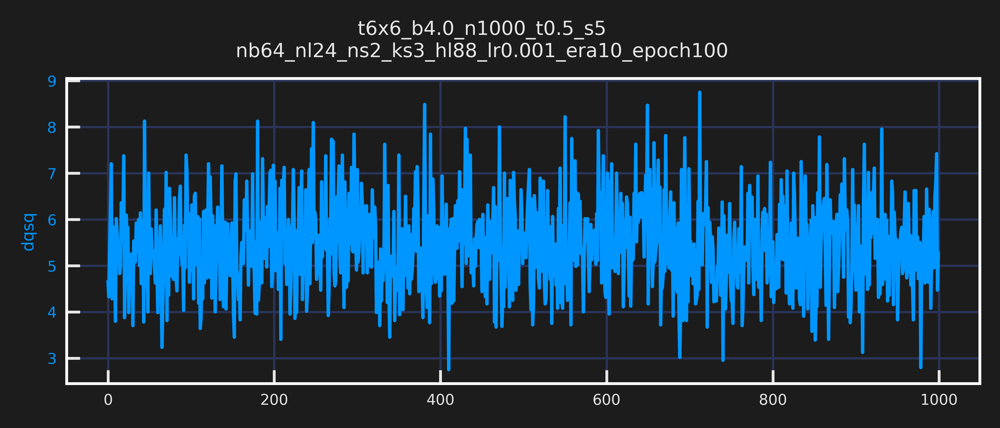

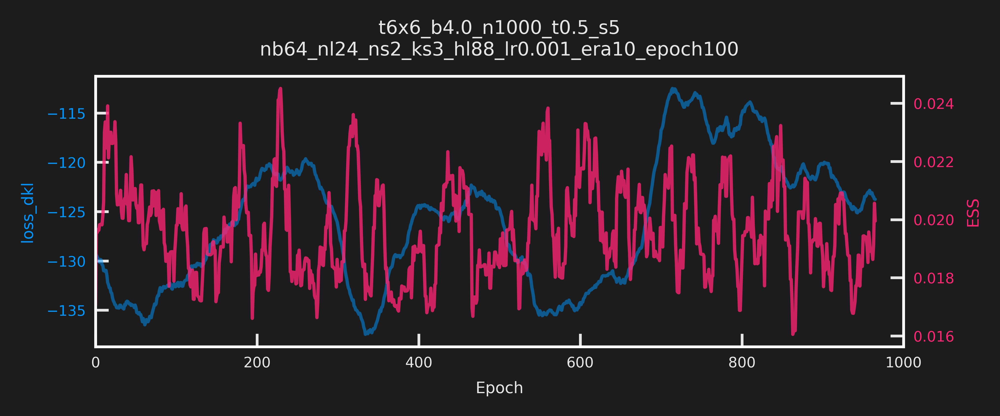

In [9]:
from dataclasses import asdict
from fthmc.train import train, transfer_to_new_lattice
%matplotlib inline

plt.style.use('default')
plt.style.use('/Users/saforem2/.matplotlib/stylelib/molokai.mplstyle')
sns.set_context('paper', font_scale=0.6)

layers = train_outputs['model']['layers']


xfr = transfer_to_new_lattice(L=6,
                              layers=layers,
                              param_init=param)
param6 = xfr['param']
model6 = xfr['model']

cfg_dict = asdict(train_config)
cfg_dict['base_lr'] = 0.0005
train_config6 = TrainConfig(**cfg_dict)

train_outputs6 = train(param6,
                       train_config6,
                       model=model6,
                       pre_model=None,
                       figsize=(5, 2))

#pre_flow_plots = train_outputs['plots']
#pre_flow_history = train_outputs['history']
#flow_act = train_outputs['action']
#pre_flow_model = train_outputs['model']
#pre_flow_optimizer = train_outputs['optimizer']

In [ ]:
txfrtxfr

[17:51:59]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730

[17:51:59]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.0_n256_t1.0_s10/plots/ inference/pre_flow_model/2021-06-08-1730

[17:51:59]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730/ess.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730/q.pdf

[17:52:00]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730/dqsq.
            pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730/dkl.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730/logq.
            pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730/logp.
            pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730/accep
            ted.pdf

[17:52:00]  Saving inference_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/
            fthmc/logs/out_t4x4_b4.0_n256_t1.0_s10/plots/                                    
            inference/pre_flow_model/2021-06-08-1730/inference_metrics.z.

[17:52:01]  Accept rate: 0.177

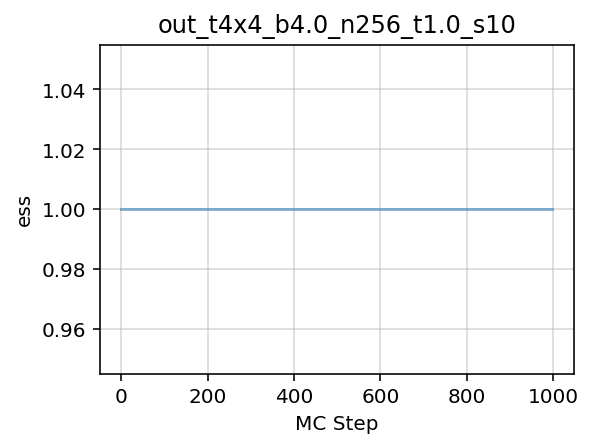

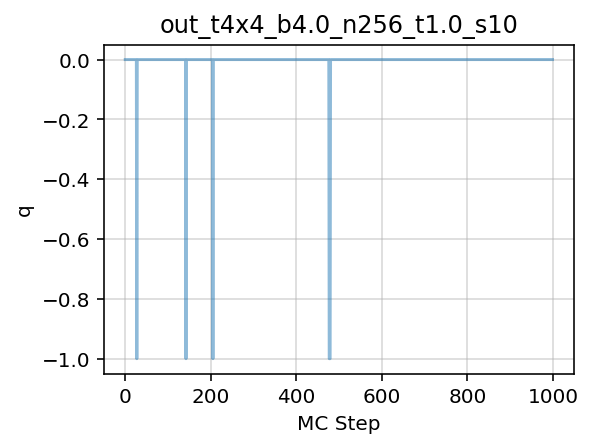

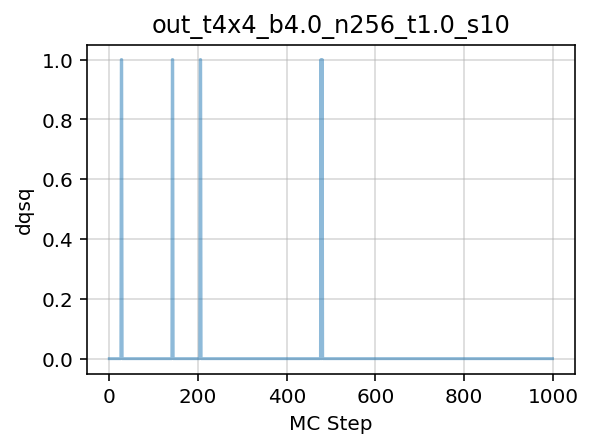

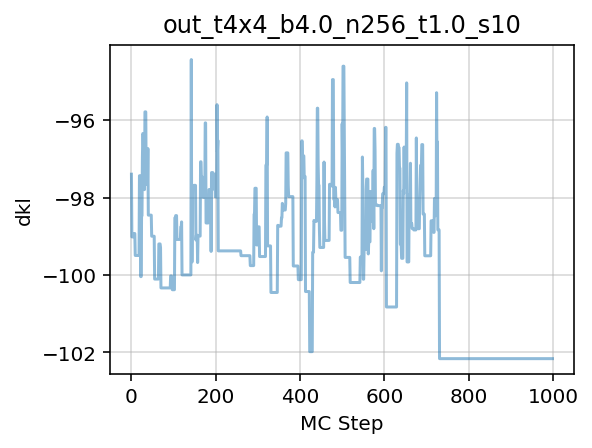

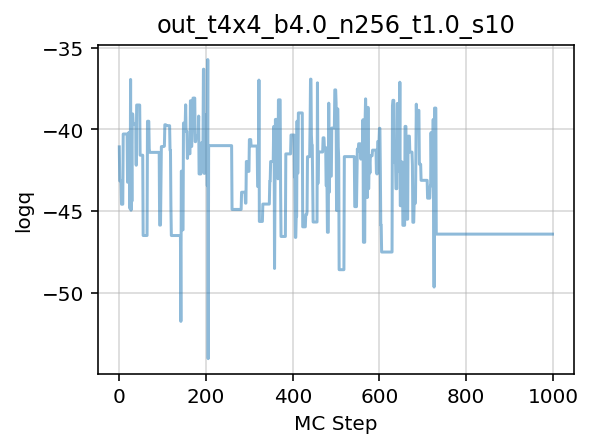

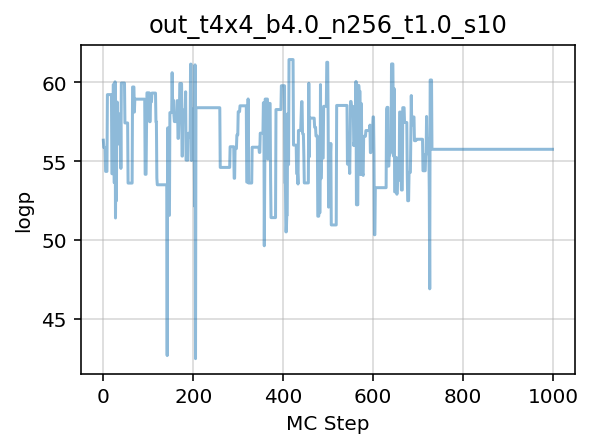

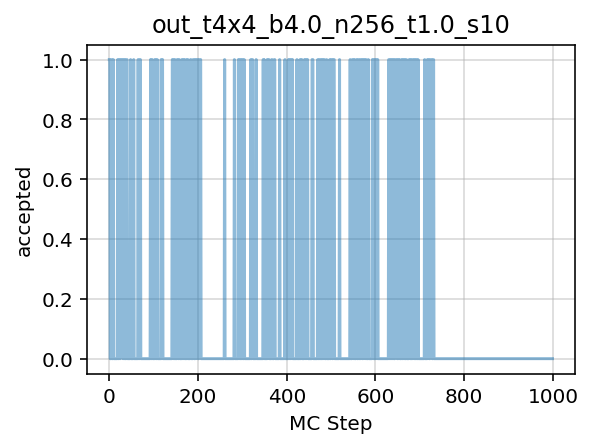

In [8]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

history = make_mcmc_ensemble(model=train_outputs['model'],
                             action_fn=train_outputs['action'],
                             batch_size=train_config.batch_size,
                             num_samples=1000)

pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', tstamp)
    
mdir = os.path.join(PLOTS_DIR,' inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'inference', 'pre_flow_model', TSTAMP)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=history,
             param=param, skip=['epoch', 'x'],
             num_chains=2, therm_frac=0.0,#, thin=10,
             xlabel='MC Step', outdir=pdir, alpha=0.5)

mfile = os.path.join(mdir, 'inference_metrics.z')

io.save_history(history, mfile, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [9]:
from fthmc.config import grab

#for key, val in history.items():
#    #x = grab(val)
#    if key == 'x':
#        continue
#        
#    logger.log(f'({key}) shape: {val.shape}, mean: {np.mean(val)}')
np.mean(history['accepted'])
#np.mean(history['accepted'])

0.177

In [10]:
from fthmc.utils.samplers import generate_ensemble

outputs = generate_ensemble(pre_flow_model, flow_act, logger=logger)

history = outputs['history']
#u1_ens = outputs['ensemble']

pre_flow = pre_flow_model['layers']

[17:52:11]  accept_rate=0.2353515625

            top_susceptibility=0.02372 +/- 0.00675

[17:52:13]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175213

[17:52:13]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.0_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-175213

[17:52:13]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/ste
            p_175213.pdf

[17:52:13]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/step_1
            75213.pdf

[17:52:13]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/dt_
            175213.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/dt_175
            213.pdf

[17:52:14]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/los
            s_175214.pdf

[17:52:14]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/loss_1
            75214.pdf

[17:52:14]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/q_1
            75214.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/q_1752
            14.pdf

[17:52:14]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/dq_
            175214.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/dq_175
            214.pdf

[17:52:14]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/ess
            _175214.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/ess_17
            5214.pdf

[17:52:14]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/pla
            q_175214.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/plaq_1
            75214.pdf

[17:52:15]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/los
            s_dkl_175215.pdf

[17:52:15]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/loss_d
            kl_175215.pdf

[17:52:15]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/log
            p_175215.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/logp_1
            75215.pdf

[17:52:15]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/log
            q_175215.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/logq_1
            75215.pdf

[17:52:15]  Saving train_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthm
            c/logs/out_t4x4_b4.0_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-175
            213/train_metrics.z.

KeyboardInterrupt: 

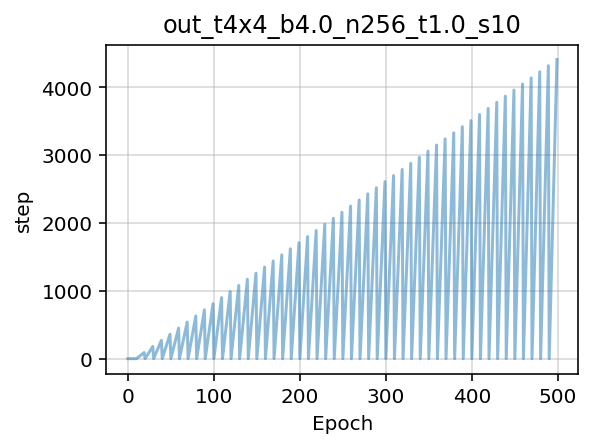

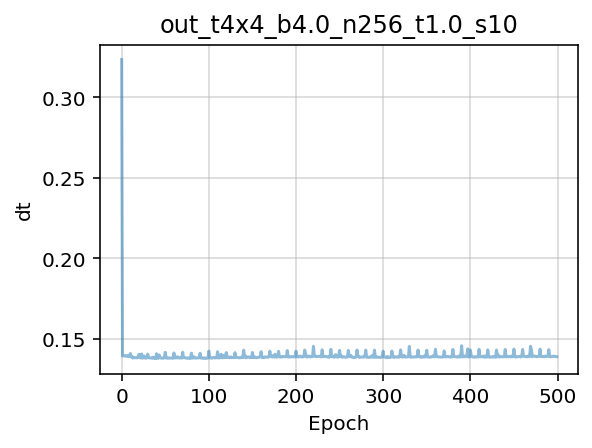

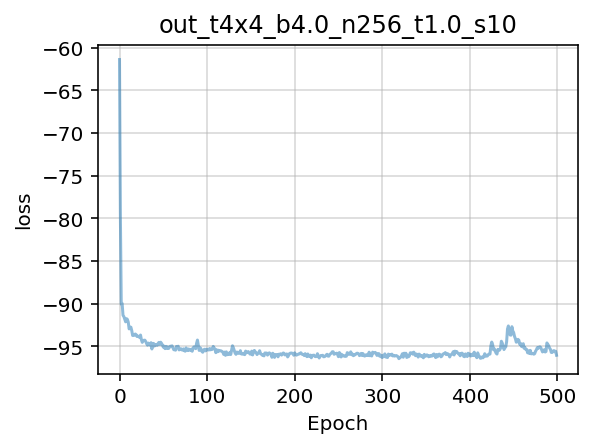

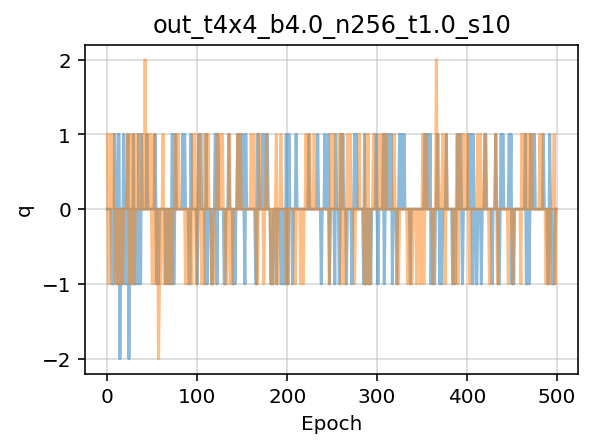

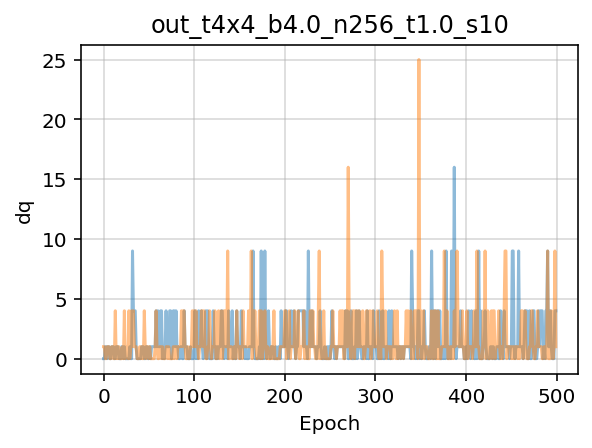

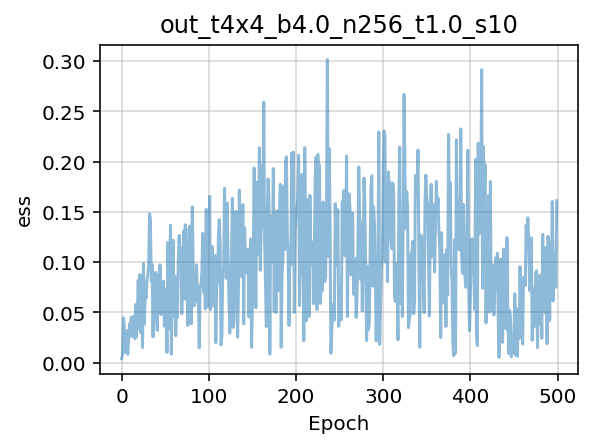

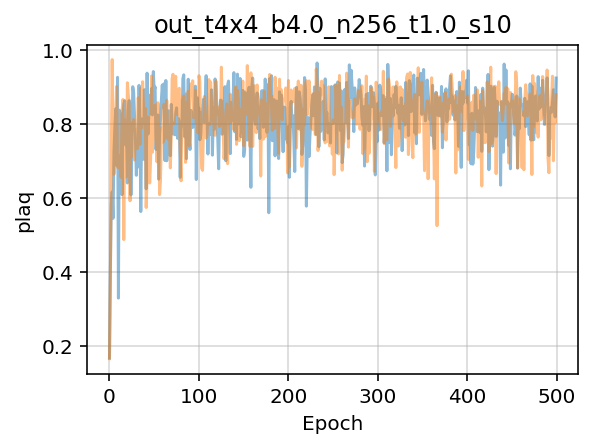

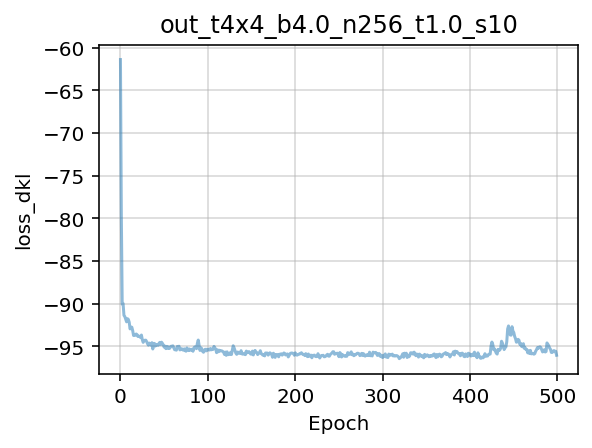

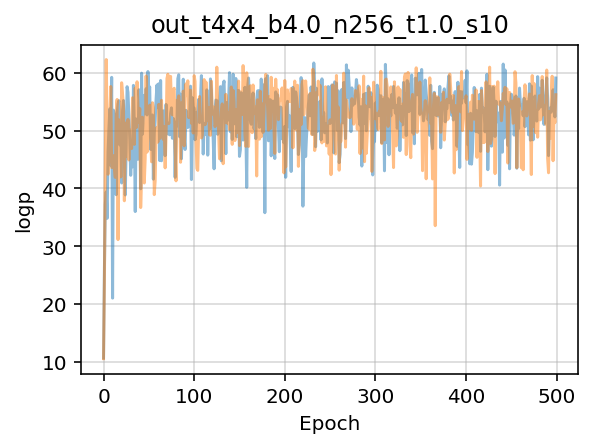

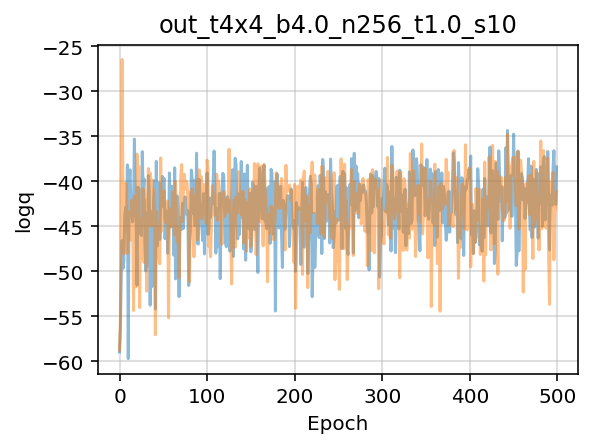

In [11]:
import matplotlib.pyplot as plt

from fthmc.utils.plot_helpers import plot_history

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', tstamp)
    
mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', tstamp)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=train_outputs['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=outdir, alpha=0.5)

mfile = os.path.join(mdir, 'train_metrics.z')
io.save_history(train_outputs['history'], mfile, name='train_metrics')

In [12]:
train_force = False
flow_model = None

if train_force:
    flow_model, flow_act = flow_train(param, with_force=True, pre_model=pre_flow_model)
else:
    flow_model = pre_flow_model
    
u1_ens = generate_ensemble(flow_model, flow_act, logger=logger)
flow = flow_model['layers']
flow.eval()

[17:52:20]  accept_rate=0.1376953125

            top_susceptibility=0.02362 +/- 0.01007

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

# Try increasing $\beta$ on `4x4` lattice

In [14]:
from dataclasses import asdict

pdict = asdict(param)
logger.log(pdict)

[22:27:46]  {                                                                                
                'beta': 4.0,                                                                 
                'L': 4,                                                                      
                'tau': 0.5,                                                                  
                'nstep': 5,                                                                  
                'ntraj': 1000,                                                               
                'nrun': 2,                                                                   
                'nprint': 100,                                                               
                'seed': 1331,                                                                
                'randinit': False,                                                           
                'nth': 2,                                                                    
                'nth_interop': 2                                                             
            }

In [15]:
type(pre_flow_model['layers'])

torch.nn.modules.container.ModuleList

[17:52:39]  Param:                                                                           
            ----------------                                                                 
            beta=4.5                                                                         
            L=4                                                                              
            tau=1.0                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[4, 4]                                                                       
            nd=2                                                                             
            shape=[2, 4, 4]                                                                  
            volume=16                                                                        
            dt=0.1

[17:52:39]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10

[17:52:39]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/models

[17:52:39]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/metrics

[17:52:39]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/plots

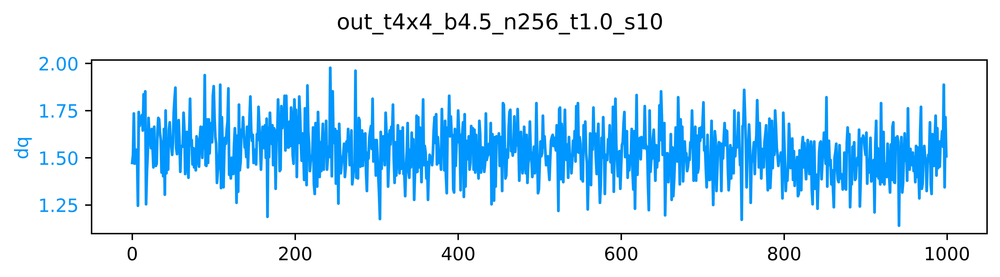

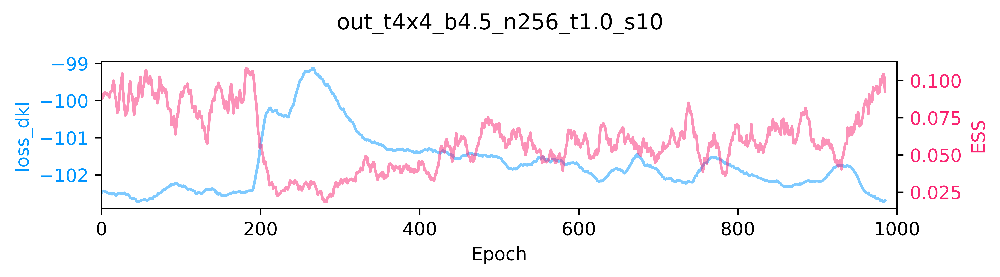

[17:52:41]  ---------------------------------------                                          
            ERA=0, last took: 0 min 0 s                                                      
            ---------------------------------------

[17:52:55]  epoch=97.000 step=0.000 dt=0.138 loss=-102.197 dq=1.65469 ess=0.0593313          
            plaq=0.846854 loss_dkl=-102.197 logp=60.9735 logq=-41.2232

[17:52:56]  ---------------------------------------                                          
            ERA=1, last took: 0 min 15.79 s                                                  
            ---------------------------------------

[17:53:10]  epoch=97.000 step=97.000 dt=0.138 loss=-102.331 dq=1.65469 ess=0.114545          
            plaq=0.840753 loss_dkl=-102.331 logp=60.5342 logq=-41.7966

[17:53:12]  ---------------------------------------                                          
            ERA=2, last took: 0 min 15.86 s                                                  
            ---------------------------------------

[17:53:26]  epoch=97.000 step=194.000 dt=0.138 loss=-99.6948 dq=1.57734 ess=0.031886         
            plaq=0.849467 loss_dkl=-99.6948 logp=61.1616 logq=-38.5332

[17:53:28]  ---------------------------------------                                          
            ERA=3, last took: 0 min 15.88 s                                                  
            ---------------------------------------

[17:53:42]  epoch=97.000 step=291.000 dt=0.137 loss=-101.36 dq=1.51797 ess=0.029906          
            plaq=0.846599 loss_dkl=-101.36 logp=60.9551 logq=-40.405

[17:53:44]  ---------------------------------------                                          
            ERA=4, last took: 0 min 15.82 s                                                  
            ---------------------------------------

[17:53:58]  epoch=97.000 step=388.000 dt=0.136 loss=-101.517 dq=1.49219 ess=0.0611839        
            plaq=0.851672 loss_dkl=-101.517 logp=61.3204 logq=-40.1965

[17:54:00]  ---------------------------------------                                          
            ERA=5, last took: 0 min 15.72 s                                                  
            ---------------------------------------

[17:54:13]  epoch=97.000 step=485.000 dt=0.136 loss=-101.699 dq=1.45703 ess=0.0909918        
            plaq=0.850273 loss_dkl=-101.699 logp=61.2196 logq=-40.4793

[17:54:15]  ---------------------------------------                                          
            ERA=6, last took: 0 min 15.74 s                                                  
            ---------------------------------------

[17:54:29]  epoch=97.000 step=582.000 dt=0.137 loss=-101.831 dq=1.59219 ess=0.0552301        
            plaq=0.847837 loss_dkl=-101.831 logp=61.0443 logq=-40.7872

[17:54:31]  ---------------------------------------                                          
            ERA=7, last took: 0 min 15.78 s                                                  
            ---------------------------------------

[17:54:45]  epoch=97.000 step=679.000 dt=0.136 loss=-101.723 dq=1.50391 ess=0.0477211        
            plaq=0.851465 loss_dkl=-101.723 logp=61.3055 logq=-40.4175

[17:54:47]  ---------------------------------------                                          
            ERA=8, last took: 0 min 15.8 s                                                   
            ---------------------------------------

[17:55:01]  epoch=97.000 step=776.000 dt=0.137 loss=-102.114 dq=1.58984 ess=0.0718534        
            plaq=0.850345 loss_dkl=-102.114 logp=61.2249 logq=-40.8893

[17:55:03]  ---------------------------------------                                          
            ERA=9, last took: 0 min 15.8 s                                                   
            ---------------------------------------

[17:55:17]  epoch=97.000 step=873.000 dt=0.137 loss=-102.646 dq=1.60234 ess=0.0595918        
            plaq=0.850079 loss_dkl=-102.646 logp=61.2057 logq=-41.4398

[17:55:19]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1752

[17:55:19]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/out_t4x4_b4.5_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1752/pre_flow_m
            odel.tar

[17:55:19]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1752

[17:55:19]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1752/dq_tra
            ining.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1752/loss_d
            kl_ess_training.pdf

[17:55:19]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519

[17:55:19]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-1752

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/step
            .pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/dt.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/loss
            .pdf

[17:55:20]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/q.pd
            f

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/dq.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/ess.
            pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/plaq
            .pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/loss
            _dkl.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/logp
            .pdf

[17:55:21]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/logq
            .pdf

[17:55:21]  Saving train_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthm
            c/logs/out_t4x4_b4.5_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-175
            2/train_metrics.z.

[17:55:26]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519

[17:55:26]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/metrics/inference/pre_flow_model/2021-06-08-1752

[17:55:26]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519/ess
            .pdf

[17:55:27]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519/q.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519/dqs
            q.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519/dkl
            .pdf

[17:55:28]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519/log
            q.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519/log
            p.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519/acc
            epted.pdf

[17:55:28]  Saving inference_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/
            fthmc/logs/out_t4x4_b4.5_n256_t1.0_s10/metrics/inference/pre_flow_model/2021-06-0
            8-1752/inference_metrics.z.

[17:55:34]  Accept rate: 0.2353515625

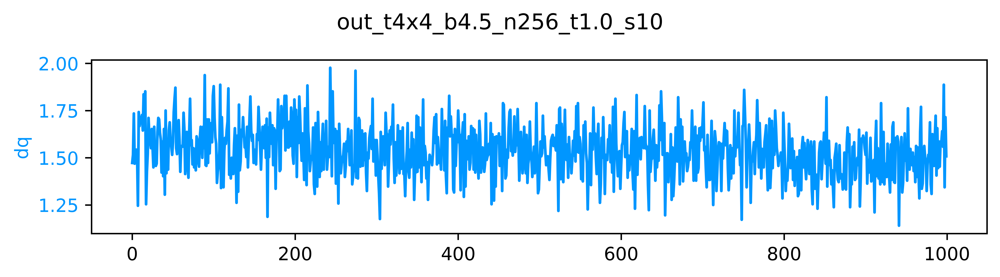

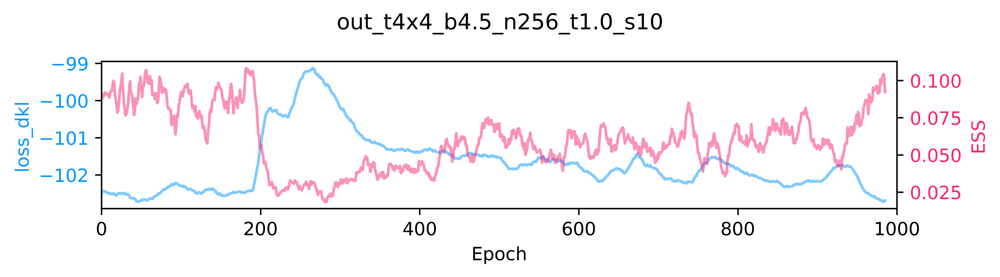

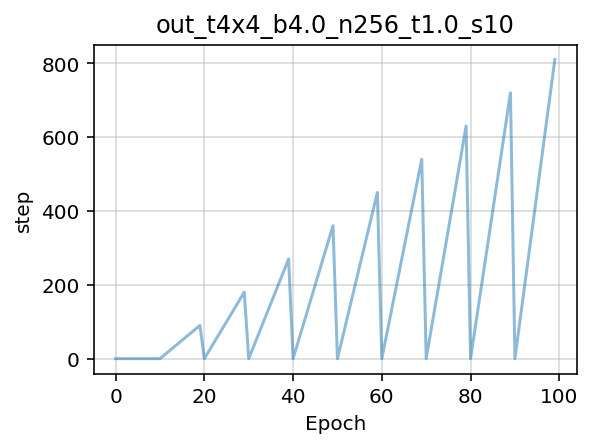

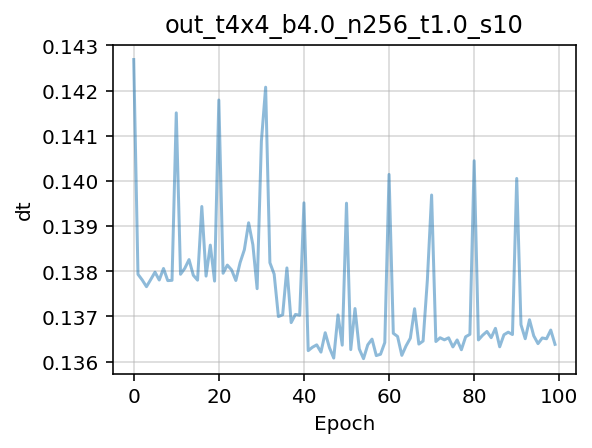

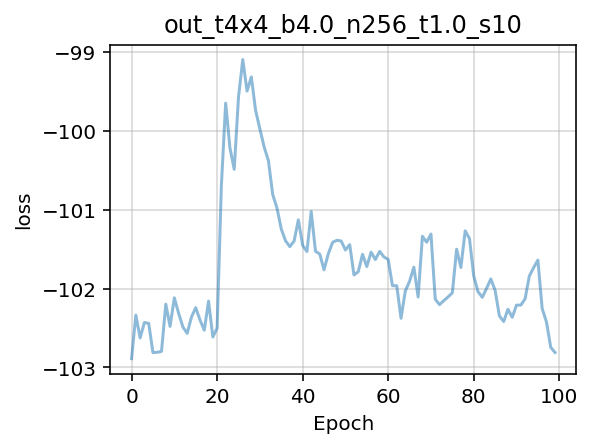

...

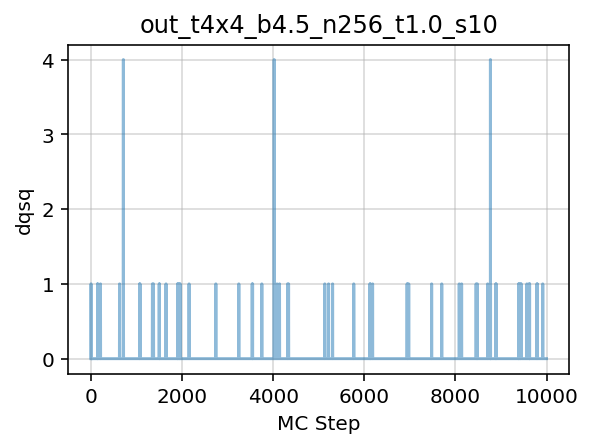

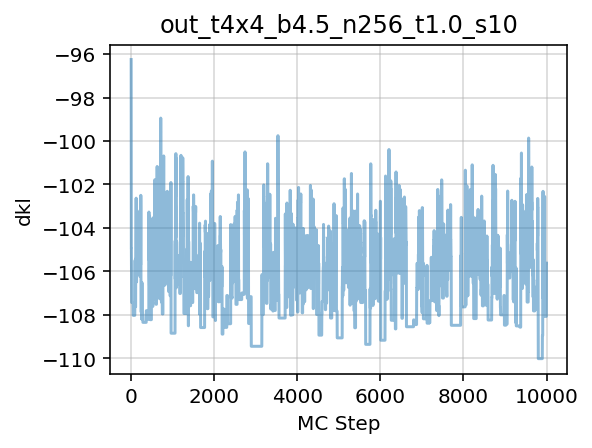

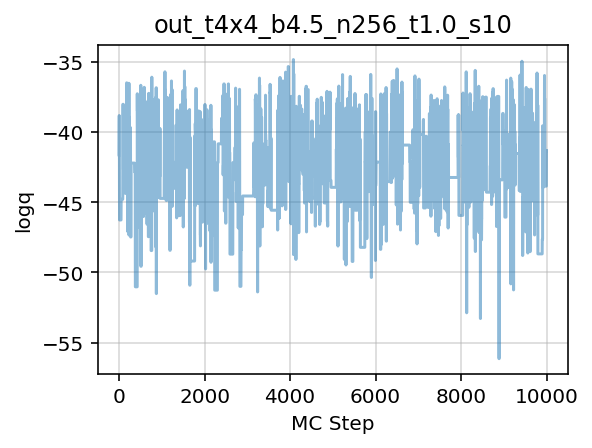

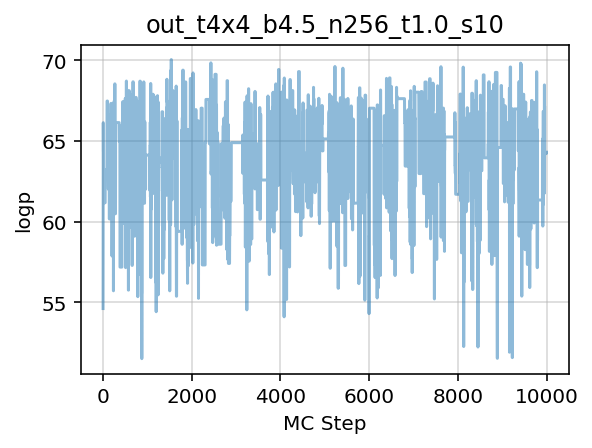

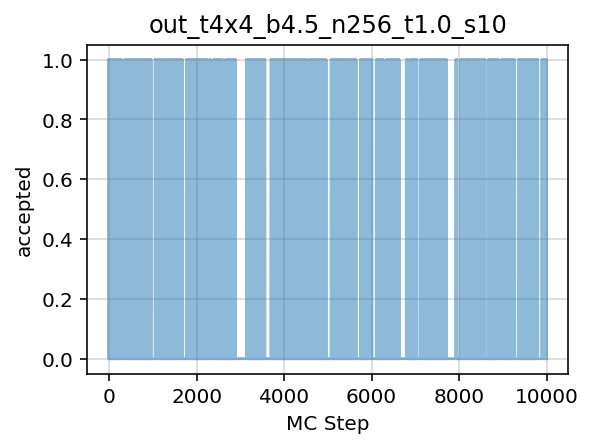

In [13]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history

param4 = Param(**{
    'L': 4,
    'tau': 1.,
    'nrun': 5,
    'beta': 4.5,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 100,
    'seed': 1331,
})

logger.log(repr(param4))

flow4 = make_net_from_layers(lattice_shape=tuple(param.lat),
                              nets=get_nets(pre_flow_model['layers']))


train_config4 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior4 = MultivariateUniform(torch.zeros((2, *param4.lat)),
                              2. * PI * torch.ones(tuple(param4.lat)))

model4 = {'layers': flow4, 'prior': prior4}

DAYSTR4 = io.get_timestamp('%Y-%m-%d')
NOW4 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP4 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR4 = os.path.join(LOGS_DIR,
                           param4.uniquestr())
METRICS_DIR4 = os.path.join(PARAM_DIR4, 'metrics')
MODEL_DIR4 = os.path.join(PARAM_DIR4, 'models')
PLOTS_DIR4 = os.path.join(PARAM_DIR4, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR4)
io.check_else_make_dir(MODEL_DIR4)
io.check_else_make_dir(METRICS_DIR4)
io.check_else_make_dir(PLOTS_DIR4)

train_outputs4 = train(param4,
                        train_config4,
                        model=model4,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots4 = train_outputs4['plots']
pre_flow_history4 = train_outputs4['history']
flow_act4 = train_outputs4['action']

pre_flow_model4 = train_outputs4['model']
pre_flow_optimizer4 = train_outputs4['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step4 = train_config4.n_era * train_config4.n_epoch

outfile4 = os.path.join(MODEL_DIR4, 'pre_flow_model', TSTAMP4, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step4,
    outfile=outfile4,
    model=pre_flow_model4['layers'],
    optimizer=pre_flow_optimizer4,
    history=train_outputs4['history'],
    overwrite=True,
)

plots4 = train_outputs4['plots']
outdir4 = os.path.join(PLOTS_DIR4, 'training', 'pre_flow_model', TSTAMP4)

save_live_plots(plots4, outdir4)


tstamp4 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir4 = os.path.join(PLOTS_DIR4, 'training', 'pre_flow_model', TSTAMP4)
if os.path.isdir(pdir4):
    pdir4 = os.path.join(PLOTS_DIR4, 'training', 'pre_flow_model', tstamp4)
    
mdir4 = os.path.join(METRICS_DIR4, 'training', 'pre_flow_model', TSTAMP4)
if os.path.isdir(mdir4):
    mdir4 = os.path.join(METRICS_DIR4, 'training', 'pre_flow_model', tstamp4)
    
io.check_else_make_dir(pdir4)
io.check_else_make_dir(mdir4)

plot_history(history=train_outputs4['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir4, alpha=0.5)

mfile4 = os.path.join(mdir4, 'train_metrics.z')
io.save_history(train_outputs4['history'], mfile4, name='train_metrics')


history4 = make_mcmc_ensemble(model=train_outputs4['model'],
                               action_fn=train_outputs4['action'],
                               batch_size=train_config4.batch_size,
                               num_samples=10000)

pdir4 = os.path.join(PLOTS_DIR4, 'inference', 'pre_flow_model', TSTAMP4)
if os.path.isdir(pdir):
    pdir4 = os.path.join(PLOTS_DIR4, 'inference', 'pre_flow_model', tstamp4)
    
mdir4 = os.path.join(PLOTS_DIR4,'inference', 'pre_flow_model', TSTAMP4)
if os.path.isdir(mdir):
    mdir4 = os.path.join(METRICS_DIR4, 'inference', 'pre_flow_model', TSTAMP4)
    
io.check_else_make_dir(pdir4)
io.check_else_make_dir(mdir4)

plot_history(history=history4,
             param=param4,
             outdir=pdir4,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile4 = os.path.join(mdir4, 'inference_metrics.z')

io.save_history(history4, mfile4, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

## Extract layers from `pre_flow_model` and transfer learning to larger lattice

## Transfer up to $8\times8$ lattice

In [14]:
logger.log(repr(param))
logger.log(train_config)

[17:56:10]  Param:                                                                           
            ----------------                                                                 
            beta=4.0                                                                         
            L=4                                                                              
            tau=1.0                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[4, 4]                                                                       
            nd=2                                                                             
            shape=[2, 4, 4]                                                                  
            volume=16                                                                        
            dt=0.1

            TrainConfig(                                                                     
                n_era=50,                                                                    
                n_epoch=100,                                                                 
                n_layers=24,                                                                 
                n_s_nets=2,                                                                  
                hidden_sizes=[8, 8],                                                         
                kernel_size=3,                                                               
                base_lr=0.001,                                                               
                batch_size=256,                                                              
                print_freq=100,                                                              
                plot_freq=100,                                                               
                with_force=False                                                             
            )

[17:57:32]  Param:                                                                           
            ----------------                                                                 
            beta=4.5                                                                         
            L=8                                                                              
            tau=1.0                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.1

            Param:                                                                           
            ----------------                                                                 
            beta=4.5                                                                         
            L=8                                                                              
            tau=1.0                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.1

[17:57:32]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10

[17:57:32]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/models

[17:57:32]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/metrics

[17:57:32]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/plots

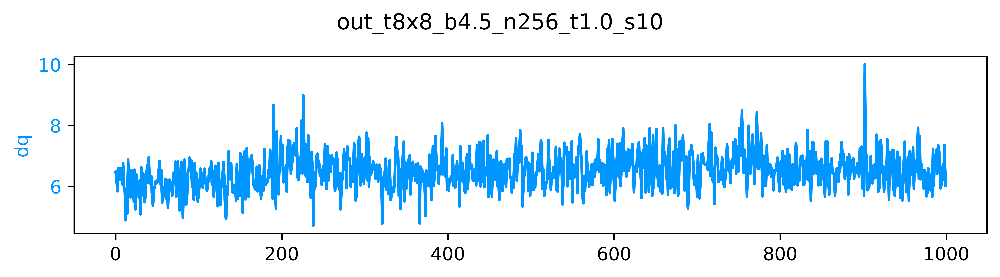

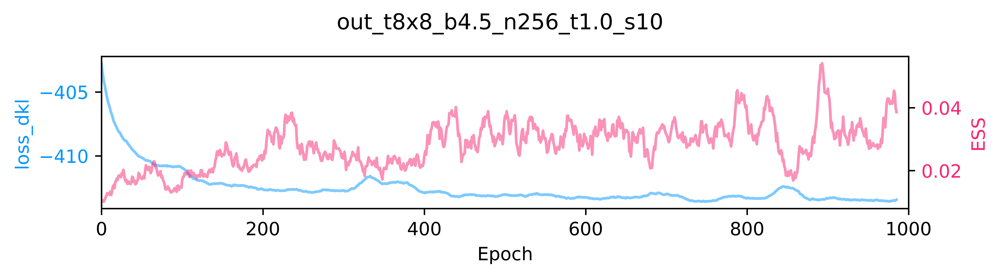

[17:57:34]  ---------------------------------------                                          
            ERA=0, last took: 0 min 0 s                                                      
            ---------------------------------------

[17:57:48]  epoch=97.000 step=0.000 dt=0.138 loss=-410.738 dq=6.14062 ess=0.0160448          
            plaq=0.854433 loss_dkl=-410.738 logp=246.077 logq=-164.661

[17:57:50]  ---------------------------------------                                          
            ERA=1, last took: 0 min 15.79 s                                                  
            ---------------------------------------

[17:58:03]  epoch=97.000 step=97.000 dt=0.138 loss=-412.487 dq=6.43906 ess=0.0198629         
            plaq=0.856063 loss_dkl=-412.487 logp=246.546 logq=-165.94

[17:58:05]  ---------------------------------------                                          
            ERA=2, last took: 0 min 15.88 s                                                  
            ---------------------------------------

[17:58:19]  epoch=97.000 step=194.000 dt=0.138 loss=-412.831 dq=6.41641 ess=0.0235801        
            plaq=0.857793 loss_dkl=-412.831 logp=247.044 logq=-165.786

[17:58:21]  ---------------------------------------                                          
            ERA=3, last took: 0 min 15.8 s                                                   
            ---------------------------------------

[17:58:35]  epoch=97.000 step=291.000 dt=0.138 loss=-412.494 dq=6.6125 ess=0.019567          
            plaq=0.857948 loss_dkl=-412.494 logp=247.089 logq=-165.405

[17:58:37]  ---------------------------------------                                          
            ERA=4, last took: 0 min 15.87 s                                                  
            ---------------------------------------

[17:58:51]  epoch=97.000 step=388.000 dt=0.138 loss=-413.279 dq=6.38672 ess=0.0266166        
            plaq=0.859804 loss_dkl=-413.279 logp=247.624 logq=-165.655

[17:58:53]  ---------------------------------------                                          
            ERA=5, last took: 0 min 15.89 s                                                  
            ---------------------------------------

[17:59:07]  epoch=97.000 step=485.000 dt=0.138 loss=-413.305 dq=6.66563 ess=0.0212893        
            plaq=0.857857 loss_dkl=-413.305 logp=247.063 logq=-166.242

[17:59:09]  ---------------------------------------                                          
            ERA=6, last took: 0 min 15.91 s                                                  
            ---------------------------------------

[17:59:23]  epoch=97.000 step=582.000 dt=0.138 loss=-413.194 dq=6.34922 ess=0.042596         
            plaq=0.861468 loss_dkl=-413.194 logp=248.103 logq=-165.092

[17:59:25]  ---------------------------------------                                          
            ERA=7, last took: 0 min 15.89 s                                                  
            ---------------------------------------

[17:59:39]  epoch=97.000 step=679.000 dt=0.138 loss=-413.158 dq=6.48203 ess=0.0505137        
            plaq=0.858899 loss_dkl=-413.158 logp=247.363 logq=-165.795

[17:59:41]  ---------------------------------------                                          
            ERA=8, last took: 0 min 15.95 s                                                  
            ---------------------------------------

[17:59:55]  epoch=97.000 step=776.000 dt=0.138 loss=-413.491 dq=6.725 ess=0.0397762          
            plaq=0.859165 loss_dkl=-413.491 logp=247.44 logq=-166.052

[17:59:57]  ---------------------------------------                                          
            ERA=9, last took: 0 min 15.91 s                                                  
            ---------------------------------------

[18:00:11]  epoch=97.000 step=873.000 dt=0.138 loss=-413.377 dq=6.53438 ess=0.0431807        
            plaq=0.86034 loss_dkl=-413.377 logp=247.778 logq=-165.6

[18:00:13]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1757

[18:00:13]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/out_t8x8_b4.5_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1757/pre_flow_m
            odel.tar

[18:00:13]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1757

[18:00:13]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1757/dq_tra
            ining.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1757/loss_d
            kl_ess_training.pdf

[18:00:13]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013

[18:00:13]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-1757

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/step
            .pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/dt.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/loss
            .pdf

[18:00:14]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/q.pd
            f

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/dq.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/ess.
            pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/plaq
            .pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/loss
            _dkl.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/logp
            .pdf

[18:00:15]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/logq
            .pdf

[18:00:15]  Saving train_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthm
            c/logs/out_t8x8_b4.5_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-175
            7/train_metrics.z.

[18:00:20]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013

[18:00:20]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/metrics/inference/pre_flow_model/2021-06-08-1757

[18:00:21]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013/ess
            .pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013/q.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013/dqs
            q.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013/dkl
            .pdf

[18:00:22]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013/log
            q.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013/log
            p.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013/acc
            epted.pdf

[18:00:22]  Saving inference_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/
            fthmc/logs/out_t8x8_b4.5_n256_t1.0_s10/metrics/inference/pre_flow_model/2021-06-0
            8-1757/inference_metrics.z.

[18:00:27]  Accept rate: 0.2353515625

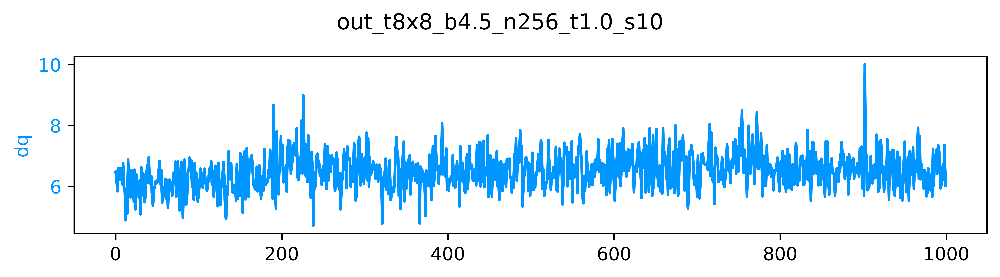

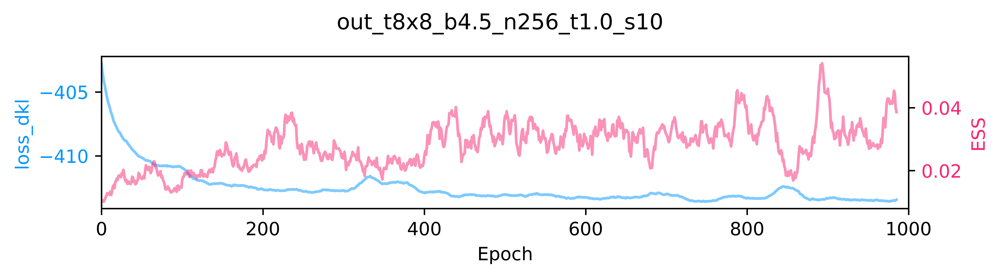

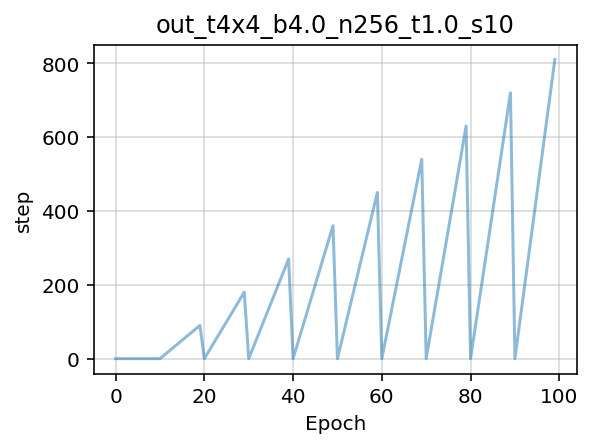

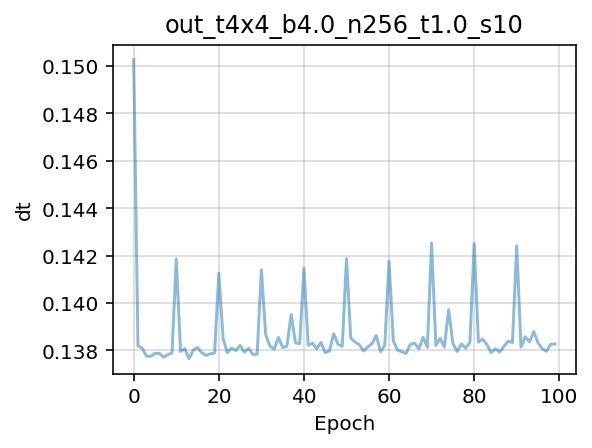

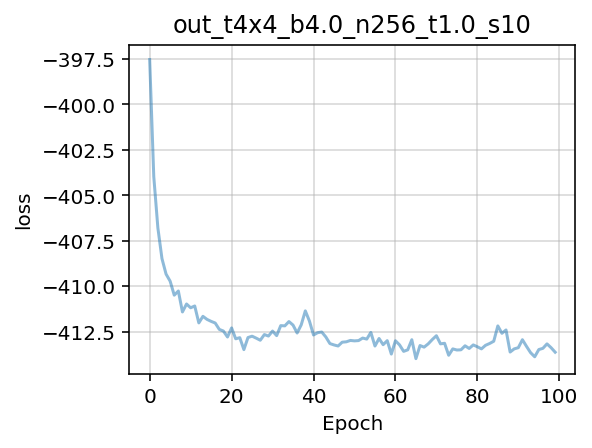

...

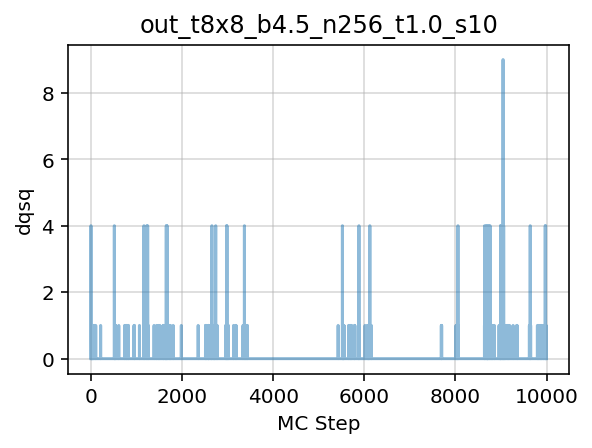

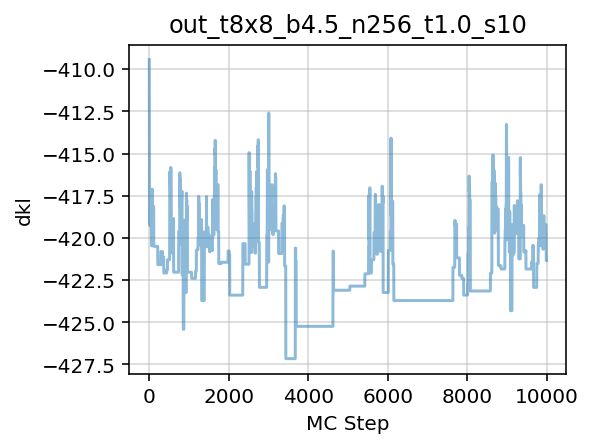

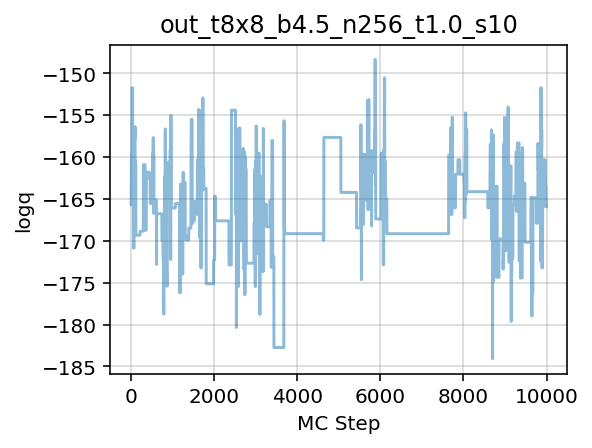

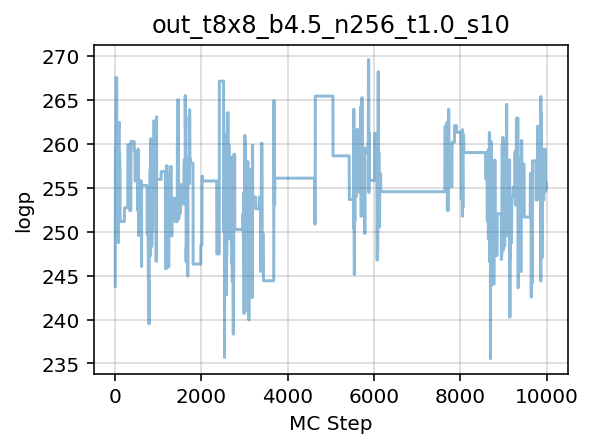

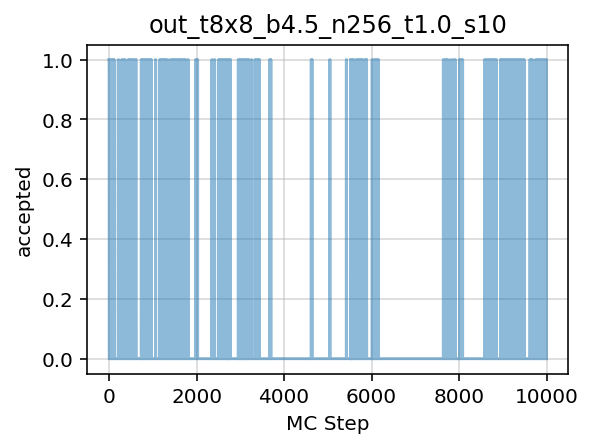

In [15]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history

param8 = Param(**{
    'L': 8,
    'tau': 1.,
    'nrun': 5,
    'beta': 4.5,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 100,
    'seed': 1331,
})

logger.log(repr(param8))

flow8 = make_net_from_layers(lattice_shape=tuple(param8.lat),
                             nets=get_nets(pre_flow_model['layers']))


train_config8 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})
logger.log(repr(param8))

prior8 = MultivariateUniform(torch.zeros((2, *param8.lat)),
                              2. * PI * torch.ones(tuple(param8.lat)))

model8 = {'layers': flow8, 'prior': prior8}

DAYSTR8 = io.get_timestamp('%Y-%m-%d')
NOW8 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8 = os.path.join(LOGS_DIR,
                           param8.uniquestr())
METRICS_DIR8 = os.path.join(PARAM_DIR8, 'metrics')
MODEL_DIR8 = os.path.join(PARAM_DIR8, 'models')
PLOTS_DIR8 = os.path.join(PARAM_DIR8, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8)
io.check_else_make_dir(MODEL_DIR8)
io.check_else_make_dir(METRICS_DIR8)
io.check_else_make_dir(PLOTS_DIR8)

train_outputs8 = train(param8,
                        train_config8,
                        model=model8,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8 = train_outputs8['plots']
pre_flow_history8 = train_outputs8['history']
flow_act8 = train_outputs8['action']

pre_flow_model8 = train_outputs8['model']
pre_flow_optimizer8 = train_outputs8['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8 = train_config8.n_era * train_config8.n_epoch

outfile8 = os.path.join(MODEL_DIR8, 'pre_flow_model', TSTAMP8, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8,
    outfile=outfile8,
    model=pre_flow_model8['layers'],
    optimizer=pre_flow_optimizer8,
    history=train_outputs8['history'],
    overwrite=True,
)

plots8 = train_outputs8['plots']
outdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', TSTAMP8)

save_live_plots(plots8, outdir8)


tstamp8 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', TSTAMP8)
if os.path.isdir(pdir8):
    pdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', tstamp8)
    
mdir8 = os.path.join(METRICS_DIR8, 'training', 'pre_flow_model', TSTAMP8)
if os.path.isdir(mdir8):
    mdir8 = os.path.join(METRICS_DIR8, 'training', 'pre_flow_model', tstamp8)
    
io.check_else_make_dir(pdir8)
io.check_else_make_dir(mdir8)

plot_history(history=train_outputs8['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8, alpha=0.5)

mfile8 = os.path.join(mdir8, 'train_metrics.z')
io.save_history(train_outputs8['history'], mfile8, name='train_metrics')


history8 = make_mcmc_ensemble(model=train_outputs8['model'],
                               action_fn=train_outputs8['action'],
                               batch_size=train_config8.batch_size,
                               num_samples=10000)

pdir8 = os.path.join(PLOTS_DIR8, 'inference', 'pre_flow_model', TSTAMP8)
if os.path.isdir(pdir):
    pdir8 = os.path.join(PLOTS_DIR8, 'inference', 'pre_flow_model', tstamp8)
    
mdir8 = os.path.join(PLOTS_DIR8,'inference', 'pre_flow_model', TSTAMP8)
if os.path.isdir(mdir):
    mdir8 = os.path.join(METRICS_DIR8, 'inference', 'pre_flow_model', TSTAMP8)
    
io.check_else_make_dir(pdir8)
io.check_else_make_dir(mdir8)

plot_history(history=history8,
             param=param8,
             outdir=pdir8,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8 = os.path.join(mdir8, 'inference_metrics.z')

io.save_history(history8, mfile8, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

# Try increasing $\beta$, using previously trained `8x8` network

In [ ]:
param8_1 = Param(
    beta=3.,
    L=8,
    tau=0.5,
    nstep=10,
    ntraj=256,
    nrun=5,
    nprint=100,
    seed=1331,
    randinit=False,
    nth=2,
    nth_interop=2,
)

logger.log(repr(param8_1))

flow8_1 = make_net_from_layers(lattice_shape=tuple(param8_1.lat),
                              nets=get_nets(pre_flow_model['layers']))


train_config8_1 = TrainConfig(
    n_era=10,
    n_epoch=100,
    n_layers=24,
    n_s_nets=2,
    hidden_sizes=[8, 8],
    kernel_size=3,
    base_lr=0.001,
    batch_size=64,
    print_freq=10,
    plot_freq=10,
    with_force=False,
)

prior8_1 = MultivariateUniform(torch.zeros((2, *param8_1.lat)),
                              2. * PI * torch.ones(tuple(param8_1.lat)))

model8_1 = {'layers': flow8_1, 'prior': prior8_1}

DAYSTR8_1 = io.get_timestamp('%Y-%m-%d')
NOW8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8_1 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8_1 = os.path.join(LOGS_DIR,
                           param8_1.uniquestr())
METRICS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'metrics')
MODEL_DIR8_1 = os.path.join(PARAM_DIR8_1, 'models')
PLOTS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8_1)
io.check_else_make_dir(MODEL_DIR8_1)
io.check_else_make_dir(METRICS_DIR8_1)
io.check_else_make_dir(PLOTS_DIR8_1)

train_outputs8_1 = train(param8_1,
                        train_config8_1,
                        model=model8_1,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8_1 = train_outputs8_1['plots']
pre_flow_history8_1 = train_outputs8_1['history']
flow_act8_1 = train_outputs8_1['action']

pre_flow_model8_1 = train_outputs8_1['model']
pre_flow_optimizer8_1 = train_outputs8_1['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8_1 = train_config8_1.n_era * train_config8_1.n_epoch

outfile8_1 = os.path.join(MODEL_DIR8_1, 'pre_flow_model', TSTAMP8_1, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8_1,
    outfile=outfile8_1,
    model=pre_flow_model8_1['layers'],
    optimizer=pre_flow_optimizer8_1,
    history=train_outputs8_1['history'],
    overwrite=True,
)

plots8_1 = train_outputs8_1['plots']
outdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)

save_live_plots(plots8_1, outdir8_1)


tstamp8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir8_1):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir8_1):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=train_outputs8_1['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8_1, alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'train_metrics.z')
io.save_history(train_outputs8_1['history'], mfile8_1, name='train_metrics')


history8_1 = make_mcmc_ensemble(model=train_outputs8_1['model'],
                               action_fn=train_outputs8_1['action'],
                               batch_size=train_config8_1.batch_size,
                               num_samples=10000)

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(PLOTS_DIR8_1,'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=history8_1,
             param=param8_1,
             outdir=pdir8_1,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'inference_metrics.z')

io.save_history(history8_1, mfile8_1, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

# Try increasing $\beta$ again...

In [ ]:
param8_1 = Param(
    beta=3.,
    L=8,
    tau=0.5,
    nstep=10,
    ntraj=256,
    nrun=5,
    nprint=100,
    seed=1331,
    randinit=False,
    nth=2,
    nth_interop=2,
)

logger.log(repr(param8_1))

flow8_1 = make_net_from_layers(lattice_shape=tuple(param8_1.lat),
                              nets=get_nets(pre_flow_model['layers']))


train_config8_1 = TrainConfig(
    n_era=10,
    n_epoch=100,
    n_layers=24,
    n_s_nets=2,
    hidden_sizes=[8, 8],
    kernel_size=3,
    base_lr=0.001,
    batch_size=64,
    print_freq=10,
    plot_freq=10,
    with_force=False,
)

prior8_1 = MultivariateUniform(torch.zeros((2, *param8_1.lat)),
                              2. * PI * torch.ones(tuple(param8_1.lat)))

model8_1 = {'layers': flow8_1, 'prior': prior8_1}

DAYSTR8_1 = io.get_timestamp('%Y-%m-%d')
NOW8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8_1 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8_1 = os.path.join(LOGS_DIR,
                           param8_1.uniquestr())
METRICS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'metrics')
MODEL_DIR8_1 = os.path.join(PARAM_DIR8_1, 'models')
PLOTS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8_1)
io.check_else_make_dir(MODEL_DIR8_1)
io.check_else_make_dir(METRICS_DIR8_1)
io.check_else_make_dir(PLOTS_DIR8_1)

train_outputs8_1 = train(param8_1,
                        train_config8_1,
                        model=model8_1,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8_1 = train_outputs8_1['plots']
pre_flow_history8_1 = train_outputs8_1['history']
flow_act8_1 = train_outputs8_1['action']

pre_flow_model8_1 = train_outputs8_1['model']
pre_flow_optimizer8_1 = train_outputs8_1['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8_1 = train_config8_1.n_era * train_config8_1.n_epoch

outfile8_1 = os.path.join(MODEL_DIR8_1, 'pre_flow_model', TSTAMP8_1, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8_1,
    outfile=outfile8_1,
    model=pre_flow_model8_1['layers'],
    optimizer=pre_flow_optimizer8_1,
    history=train_outputs8_1['history'],
    overwrite=True,
)

plots8_1 = train_outputs8_1['plots']
outdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)

save_live_plots(plots8_1, outdir8_1)


tstamp8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir8_1):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir8_1):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=train_outputs8_1['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8_1, alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'train_metrics.z')
io.save_history(train_outputs8_1['history'], mfile8_1, name='train_metrics')


history8_1 = make_mcmc_ensemble(model=train_outputs8_1['model'],
                               action_fn=train_outputs8_1['action'],
                               batch_size=train_config8_1.batch_size,
                               num_samples=10000)

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(PLOTS_DIR8_1,'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=history8_1,
             param=param8_1,
             outdir=pdir8_1,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'inference_metrics.z')

io.save_history(history8_1, mfile8_1, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

# Transfer to `12x12` lattice

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history


param12 = {
    'L': 12,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param12 = Param(**param12)
logger.log(repr(param12))

flow12 = make_net_from_layers(lattice_shape=tuple(param12.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config12 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 64,
    'print_freq': 10,
    'plot_freq': 10,
})

prior12 = MultivariateUniform(torch.zeros((2, *param12.lat)),
                              2. * PI * torch.ones(tuple(param12.lat)))

model12 = {'layers': flow12, 'prior': prior12}

DAYSTR12 = io.get_timestamp('%Y-%m-%d')
NOW12 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP12 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR12 = os.path.join(LOGS_DIR,
                           param12.uniquestr())
METRICS_DIR12 = os.path.join(PARAM_DIR12, 'metrics')
MODEL_DIR12 = os.path.join(PARAM_DIR12, 'models')
PLOTS_DIR12 = os.path.join(PARAM_DIR12, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR12)
io.check_else_make_dir(MODEL_DIR12)
io.check_else_make_dir(METRICS_DIR12)
io.check_else_make_dir(PLOTS_DIR12)

train_outputs12 = train(param12,
                        train_config12,
                        model=model12,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots12 = train_outputs12['plots']
pre_flow_history12 = train_outputs12['history']
flow_act12 = train_outputs12['action']

pre_flow_model12 = train_outputs12['model']
pre_flow_optimizer12 = train_outputs12['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step12 = train_config12.n_era * train_config12.n_epoch

outfile12 = os.path.join(MODEL_DIR12, 'pre_flow_model', TSTAMP12, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step12,
    outfile=outfile12,
    model=pre_flow_model12['layers'],
    optimizer=pre_flow_optimizer12,
    history=train_outputs12['history'],
    overwrite=True,
)

plots12 = train_outputs12['plots']
outdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)

save_live_plots(plots12, outdir12)


tstamp12 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir12):
    pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir12):
    mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=train_outputs12['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir12, alpha=0.5)

mfile12 = os.path.join(mdir12, 'train_metrics.z')
io.save_history(train_outputs12['history'], mfile12, name='train_metrics')


history12 = make_mcmc_ensemble(model=train_outputs12['model'],
                               action_fn=train_outputs12['action'],
                               batch_size=train_config12.batch_size,
                               num_samples=10000)

pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir):
    pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(PLOTS_DIR12,'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir):
    mdir12 = os.path.join(METRICS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=history12,
             param=param12,
             outdir=pdir12,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile12 = os.path.join(mdir12, 'inference_metrics.z')

io.save_history(history12, mfile12, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history


param16 = {
    'L': 16,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param16 = Param(**param16)
logger.log(repr(param16))

flow16 = make_net_from_layers(lattice_shape=tuple(param16.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config16 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 64,
    'print_freq': 10,
    'plot_freq': 10,
})

prior16 = MultivariateUniform(torch.zeros((2, *param16.lat)),
                              2. * PI * torch.ones(tuple(param16.lat)))

model16 = {'layers': flow16, 'prior': prior16}

DAYSTR16 = io.get_timestamp('%Y-%m-%d')
NOW16 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP16 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR16 = os.path.join(LOGS_DIR,
                           param16.uniquestr())
METRICS_DIR16 = os.path.join(PARAM_DIR16, 'metrics')
MODEL_DIR16 = os.path.join(PARAM_DIR16, 'models')
PLOTS_DIR16 = os.path.join(PARAM_DIR16, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR16)
io.check_else_make_dir(MODEL_DIR16)
io.check_else_make_dir(METRICS_DIR16)
io.check_else_make_dir(PLOTS_DIR16)

train_outputs16 = train(param16,
                        train_config16,
                        model=model16,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots16 = train_outputs16['plots']
pre_flow_history16 = train_outputs16['history']
flow_act16 = train_outputs16['action']

pre_flow_model16 = train_outputs16['model']
pre_flow_optimizer16 = train_outputs16['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step16 = train_config16.n_era * train_config16.n_epoch

outfile16 = os.path.join(MODEL_DIR16, 'pre_flow_model', TSTAMP16, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step16,
    outfile=outfile16,
    model=pre_flow_model16['layers'],
    optimizer=pre_flow_optimizer16,
    history=train_outputs16['history'],
    overwrite=True,
)

plots16 = train_outputs16['plots']
outdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)

save_live_plots(plots16, outdir16)


tstamp16 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir16):
    pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir16):
    mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=train_outputs16['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir16, alpha=0.5)

mfile16 = os.path.join(mdir16, 'train_metrics.z')
io.save_history(train_outputs16['history'], mfile16, name='train_metrics')


history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=train_outputs16['action'],
                               batch_size=train_config16.batch_size,
                               num_samples=10000)

pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir):
    pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(PLOTS_DIR16,'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir):
    mdir16 = os.path.join(METRICS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=history16,
             param=param16,
             outdir=pdir16,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile16 = os.path.join(mdir16, 'inference_metrics.z')

io.save_history(history16, mfile16, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
logger.log(repr(param))

In [ ]:
logger.log(train_config)

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets

param12 = {
    'L': 12,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param12 = Param(**param12)
logger.log(repr(param12))

flow12 = make_net_from_layers(lattice_shape=tuple(param12.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config12 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [12, 12],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior12 = MultivariateUniform(torch.zeros((2, *param12.lat)),
                              2. * PI * torch.ones(tuple(param12.lat)))

model12 = {'layers': flow12, 'prior': prior12}

In [ ]:
DAYSTR12 = io.get_timestamp('%Y-%m-%d')
NOW12 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP12 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR12 = os.path.join(LOGS_DIR,
                           param12.uniquestr())
METRICS_DIR12 = os.path.join(PARAM_DIR12, 'metrics')
MODEL_DIR12 = os.path.join(PARAM_DIR12, 'models')
PLOTS_DIR12 = os.path.join(PARAM_DIR12, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR12)
io.check_else_make_dir(MODEL_DIR12)
io.check_else_make_dir(METRICS_DIR12)
io.check_else_make_dir(PLOTS_DIR12)

In [ ]:
train_outputs12 = train(param12,
                        train_config12,
                        model=model12,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots12 = train_outputs12['plots']
pre_flow_history12 = train_outputs12['history']
flow_act12 = train_outputs12['action']

pre_flow_model12 = train_outputs12['model']
pre_flow_optimizer12 = train_outputs12['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step12 = train_config12.n_era * train_config12.n_epoch

outfile12 = os.path.join(MODEL_DIR12, 'pre_flow_model', TSTAMP12, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step12,
    outfile=outfile12,
    model=pre_flow_model12['layers'],
    optimizer=pre_flow_optimizer12,
    history=train_outputs12['history'],
    overwrite=True,
)

plots12 = train_outputs12['plots']
outdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)

save_live_plots(plots12, outdir12)

In [ ]:
from fthmc.utils.plot_helpers import plot_history

tstamp12 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir12):
    pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir12):
    mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=train_outputs12['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir12, alpha=0.5)

mfile12 = os.path.join(mdir12, 'train_metrics.z')
io.save_history(train_outputs12['history'], mfile12, name='train_metrics')

In [ ]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed


history12 = make_mcmc_ensemble(model=train_outputs12['model'],
                               action_fn=train_outputs12['action'],
                               batch_size=train_config12.batch_size,
                               num_samples=10000)

pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir):
    pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(PLOTS_DIR12,'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir):
    mdir12 = os.path.join(METRICS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=history12,
             param=param12,
             outdir=pdir12,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile12 = os.path.join(mdir12, 'inference_metrics.z')

io.save_history(history12, mfile12, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed

from fthmc.utils.plot_helpers import plot_history

param16 = {
    'L': 16,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param16 = Param(**param16)
logger.log(repr(param16))

flow16 = make_net_from_layers(lattice_shape=tuple(param16.lat),
                              nets=get_nets(pre_flow_model12['layers']))

train_config16 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [16, 16],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior16 = MultivariateUniform(torch.zeros((2, *param16.lat)),
                              2. * PI * torch.ones(tuple(param16.lat)))

model16 = {'layers': flow16, 'prior': prior16}

DAYSTR16 = io.get_timestamp('%Y-%m-%d')
NOW16 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP16 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR16 = os.path.join(LOGS_DIR,
                           param16.uniquestr())
METRICS_DIR16 = os.path.join(PARAM_DIR16, 'metrics')
MODEL_DIR16 = os.path.join(PARAM_DIR16, 'models')
PLOTS_DIR16 = os.path.join(PARAM_DIR16, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR16)
io.check_else_make_dir(MODEL_DIR16)
io.check_else_make_dir(METRICS_DIR16)
io.check_else_make_dir(PLOTS_DIR16)


train_outputs16 = train(param16,
                        train_config16,
                        model=model16,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots16 = train_outputs16['plots']
pre_flow_history16 = train_outputs16['history']
flow_act16 = train_outputs16['action']

pre_flow_model16 = train_outputs16['model']
pre_flow_optimizer16 = train_outputs16['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step16 = train_config16.n_era * train_config16.n_epoch

outfile16 = os.path.join(MODEL_DIR16, 'pre_flow_model', TSTAMP16, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step16,
    outfile=outfile16,
    model=pre_flow_model16['layers'],
    optimizer=pre_flow_optimizer16,
    history=train_outputs16['history'],
    overwrite=True,
)

plots16 = train_outputs16['plots']
outdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)

save_live_plots(plots16, outdir16)


tstamp16 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir16):
    pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir16):
    mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=train_outputs16['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir16, alpha=0.5)

mfile16 = os.path.join(mdir16, 'train_metrics.z')
io.save_history(train_outputs16['history'], mfile16, name='train_metrics')



history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=train_outputs16['action'],
                               batch_size=train_config16.batch_size,
                               num_samples=10000)

pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir):
    pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(PLOTS_DIR16,'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir):
    mdir16 = os.path.join(METRICS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=history16,
             param=param16,
             outdir=pdir16,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile16 = os.path.join(mdir16, 'inference_metrics.z')

io.save_history(history16, mfile16, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
pre_flow_model.keys()

In [ ]:
layers8 = pre_flow_model['layers']
logger.log([val.shape for _, val in layers8.state_dict().items()])

In [ ]:
layers12 = model12['layers']
logger.log([val.shape for _, val in layers12.state_dict().items()])

In [ ]:
layers12 = model12['layers']
logger.log(layers12.state_dict())

In [ ]:
import seaborn as sns

from dataclasses import asdict
from copy import deepcopy
from utils.distributions import MultivariateUniform
from utils.layers import make_u1_equiv_layers, set_weights
from math import pi as PI
import utils.qed_helpers as qed

TWO_PI = 2 * PI
# from train import train

sns.set_context('notebook')
sns.set_palette('bright')

train_cfg_force = asdict(train_config)
train_cfg_force['with_force'] = True

tconfig_force = TrainConfig(**train_cfg_force)

link_shape = (2, *param.lat)
lattice_shape = tuple(param.lat)
u1_action = qed.BatchAction(param.beta)

prior = MultivariateUniform(torch.zeros(link_shape),
                            TWO_PI * torch.ones(link_shape))

tconfig_force
layers = make_u1_equiv_layers(lattice_shape=lattice_shape,
                              n_layers=tconfig_force.n_layers,
                              n_mixture_comps=tconfig_force.n_s_nets,
                              hidden_sizes=tconfig_force.hidden_sizes,
                              kernel_size=tconfig_force.kernel_size)

set_weights(layers)

model_force = {
    'prior': prior,
    'layers': layers,
}
                              

outputs = train(param, tconfig_force,
                model=model_force,
                pre_model=pre_flow_model,
                figsize=(8, 2.),
                use_alt=False,
                force_factor=0.001,
                dkl_factor=1.)#, logger=logger)

flow_model_force = outputs['model']
flow_model_force_history = outputs['history']
flow_action_force = outputs['action']

In [ ]:
def test_force(
    param: Param,
    model: dict,
    x: torch.Tensor = None,
    pre_model: dict = None
):
    """Test the force.
    
    If `x` is None:
      - Draw samples `xi (~ pre_prior)` from prior and pass through `pre_model` 
        to get `x (~ pre_posterior)`.
     
    Pass `x` backwards through the `model` to get `xi (~ prior)`.
    
    Calculate `force(xi)` and `norm(force(xi))`.
    """
    if x is None:
        if pre_model is None:
            raise ValueError(f'Either `x` or `pre_model` must be specified.')
            
        # Draw samples `xi` from prior
        pre_xi = pre_model['prior'].sample_n(1)
        
        # Pass `xi` through layers in `pre_model`
        x = qed.ft_flow(pre_model['layers'], pre_xi)
        
    # Pass `x` backwards through layers in `model`
    xi = qed.ft_flow_inv(model['layers'], x)
    # Calculate force
    force = qed.ft_force(param, model['layers'], xi)
    force_norm = torch.linalg.norm(force)
    return force_norm

In [ ]:
from train import run as hmc_run
fields, metrics = hmc_run(param, logger=logger, keep_fields=True)

#metrics_dir = os.path.join(OUTDIR, 'metrics', 'hmc')
#metrics_file = os.path.join(metrics_dir, 'metrics.z')
#io.savez(metrics, metrics_file)

In [ ]:
#field_arr = torch.stack(tuple(fields.values()), dim=0)
len(fields)
#
field_arr = np.array([qed.grab(torch.stack(i)) for i in fields])
field_arr.shape
#logger.log(field_arr.shape)

In [ ]:
for field in field_arr:
    force_tf = test_force(param, flow_model_force, pre_model=pre_flow_model)
    logger.log(f'ft_flow(players, pxi), (pxi ~ pre_prior): {force_tf:.5g}') 
    
    x = torch.from_numpy(field[-1]).squeeze()[None, :]
    if torch.cuda.is_available():
        x = x.cuda()
    
    #x_ = field_arr.squeeze()[None, :]
    force_ = test_force(param, flow_model_force, x=x, pre_model=pre_flow_model)
    logger.log(f'ft_flow(layers, field_arr), (pxi ~ pre_prior): {force_:.5g}')

In [ ]:
# field_arr generated from generic HMC run
for idx, fields in enumerate(field_arr):
    # x generated from HMC
    x = torch.from_numpy(fields)
    if torch.cuda.is_available():
        x = x.cuda()
        
    # flow HMC samples backwards through `flow_model_force` and calculate force
    force1 = test_force(param, flow_model_force, x=x)
    
    # sample x ~ pre_flow_model_prior, flow through `pre_flow_model` to get xi 
    # flow xi backwards through `flow_model_force` and calculate force
    force2 = test_force(param, flow_model_force, pre_model=pre_flow_model)
    
    logger.log(f'run={idx}\n'
               f'  (xi ~ HMC): force_xi={force1:.5g}\n'
               f"  (xi ~ pre_flow_model_prior): force_xi_pre={force2:.5g}")

In [ ]:
#field_run = torch.stack(tuple(fields.values()), dim=0)
##flows = flow

#x0 = field_arr[0][None, :]
#x = field_arr[0][None, :]

# select last trajectory from last run
x = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()
x0 = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()

if torch.cuda.is_available():
    x = x.cuda()

plaq0 = qed.action(param, x) / (-param.beta * param.volume)
logger.log(f'plaq(field_arr[0])={plaq0:.8g}')

#logger\.log(f'plaq(field_run[0]) {qed.action(param, x) / (-param.beta*param.volume)}')
# field.requires_grad_(True)
#x = field_run[0][None, :]
logJ = 0.0
for layer in reversed(flow_model_force['layers']):
    x, lJ = layer.reverse(x)
    logJ += lJ

# x is the prior distribution now
    
x.requires_grad_(True)
    
y = x
logJy = 0.0
for layer in flow_model_force['layers']:
    y, lJ = layer.forward(y)
    logJy += lJ
    
s = qed.action(param, y[0][None, :]) - logJy

logger.log(f'sum(logJ): {qed.grab(logJ.sum())}')
logger.log(f'sum(logJy): {qed.grab(logJy.sum())}')
#print(logJ,logJy)


# print("eff_action", s + 136.3786)

logger.log(f'original_action: {qed.action(param, y[0][None, :]) + 91}')
#print("original_action", qed.action(param, y[0][None, :]) + 91)

logger.log(f'eff_action: {s + 56}')
#print("eff_action", {s + 56)

s.backward()

f = x.grad

x.requires_grad_(False)

logger.log(f'plaq(x) {qed.action(param, x[0][None, :]) / (-param.beta*param.volume)}  logJ {qed.grab(logJ)}  force.norm {torch.linalg.norm(f)}')
logger.log(f'plaq(y) {qed.action(param, y[0][None, :]) / (-param.beta*param.volume)}')
logger.log(f'plaq(x) {qed.action(param, x0) / (-param.beta*param.volume)}  force.norm {torch.linalg.norm(qed.force(param, x0))}')

In [ ]:
logger.log(x.shape)

field_tensor = torch.from_numpy(field_arr).cuda()

x = qed.ft_flow_inv(flow, field_tensor[-1])
# x = field_run
#for layer in reversed(flows):
#    x, lJ = layer.reverse(x)
ff = qed.ft_force(param, flow, x)
logger.log(torch.linalg.norm(ff))
fff = qed.ft_force(param, flow, x)
logger.log(torch.linalg.norm(fff))

In [ ]:
x = qed.ft_flow_inv(flow, field_tensor[-1])
logger.log(qed.grab(qed.ft_action(param, flow, x)))